# Visualise LAVD_days/coherence lifetime eddies

In [1]:
import os,sys
import trajan
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import cmocean
from datetime import datetime
import pandas as pd
from shapely.geometry import Polygon
import geopandas as gpd
import pyproj

from config import *

sys.path.append('./RCLVatlas')
from subfunctions_for_RCLV_atlas import read_RCLV_CSV_untracked,read_RCLV_CSV_tracked,save_RCLV_CSV
from mainfunctions_for_RCLV_atlas import *
from functions_for_parcels import *
from scipy import integrate

## 1. read in the data

In [13]:
rclv_path = "/work/bk1377/b382618/LAVD_days_32_days_RCLVs_full.pickle"
lavd_days_path = "/work/bk1377/b382618/LAVD_days_function/20100423_32days_LAVD.nc"

In [14]:
rclv = pd.read_pickle(rclv_path)

In [7]:
lavd = xr.open_dataset(lavd_days_path)

In [15]:
rclv

,date,RCLV_id,orientation,age_days,area_km2,center_lon,center_lat,CD,flag,Points,Polygon,group_id,age_order
0,2010-04-24,nan,cyc,nan,1220.3238762319756,197.21875,22.59375,0.02917352572318881,0,"['197.25', '22.75', '197.25', '22.75', '197.28...","POLYGON ((197.25 22.75, 197.25 22.75, 197.2812...",0,1
9,2010-04-24,nan,cyc,nan,2055.9778717007275,207.90625,17.9375,0.027566030694863786,0,"['208.03125', '18.46875', '208.0625', '18.4375...","POLYGON ((208.03125 18.46875, 208.0625 18.4375...",1,1
18,2010-04-24,nan,anti,nan,2034.5943431845405,185.0625,17.03125,0.02991513951380179,0,"['185.25', '17.34375', '185.28125', '17.34375'...","POLYGON ((185.25 17.34375, 185.28125 17.34375,...",2,1
40,2010-04-24,nan,cyc,nan,1332.1739598099123,205.96875,21.84375,0.027648821508729042,0,"['205.875', '22.125', '205.90625', '22.125', '...","POLYGON ((205.875 22.125, 205.90625 22.125, 20...",3,1
53,2010-04-24,nan,cyc,nan,2583.294522317429,208.875,21.46875,0.02948964551804136,0,"['208.9375', '21.8125', '208.9375', '21.8125',...","POLYGON ((208.9375 21.8125, 208.9375 21.8125, ...",4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
66297,2010-05-23,nan,anti,nan,1190.5554998030302,206.375,30.59375,0.02940066573459067,0,"['206.625', '30.71875', '206.65625', '30.6875'...","POLYGON ((206.625 30.71875, 206.65625 30.6875,...",150,1
66362,2010-05-24,nan,anti,nan,5766.380146460185,200.125,17.6875,0.019223482029749,0,"['200.46875', '17.90625', '200.46875', '17.906...","POLYGON ((200.46875 17.90625, 200.46875 17.906...",70,22
66374,2010-05-24,nan,anti,nan,3127.1111104979846,193.875,16.53125,0.02073359760479094,0,"['193.78125', '16.78125', '193.8125', '16.7812...","POLYGON ((193.78125 16.78125, 193.8125 16.7812...",7,21
66395,2010-05-24,nan,cyc,nan,1394.726033821938,196.46875,20.59375,0.020967693843752074,0,"['196.5625', '20.6875', '196.59375', '20.6875'...","POLYGON ((196.5625 20.6875, 196.59375 20.6875,...",148,3


## 2. daily LAVD_days fields and daily RCLV plots

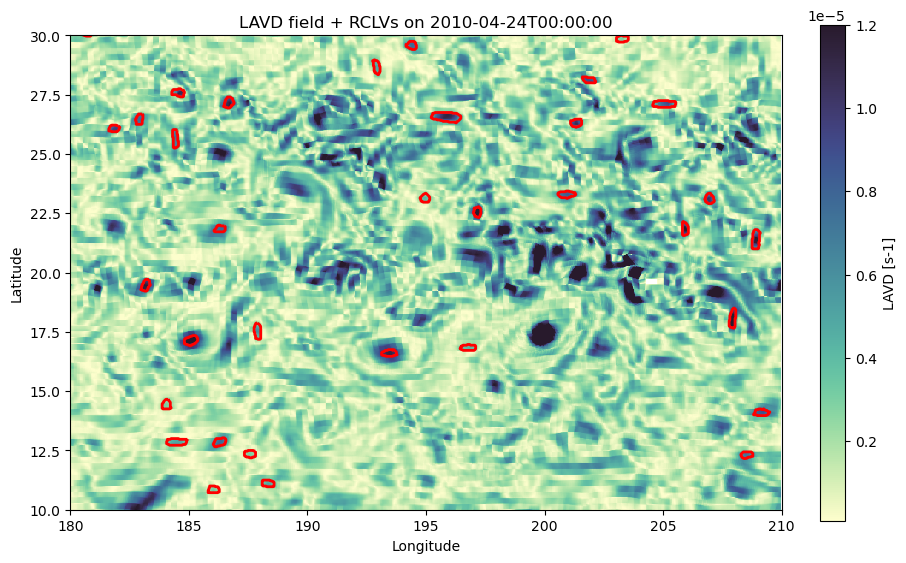

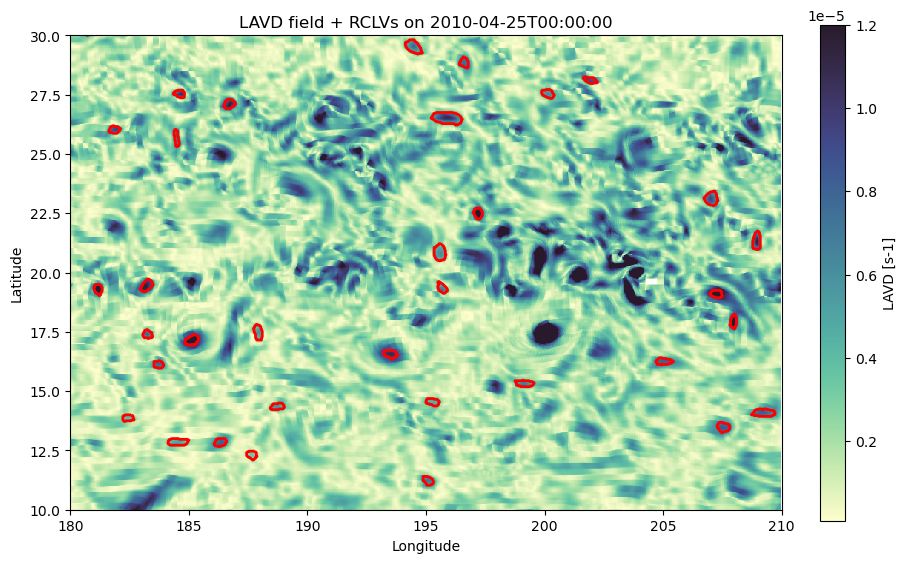

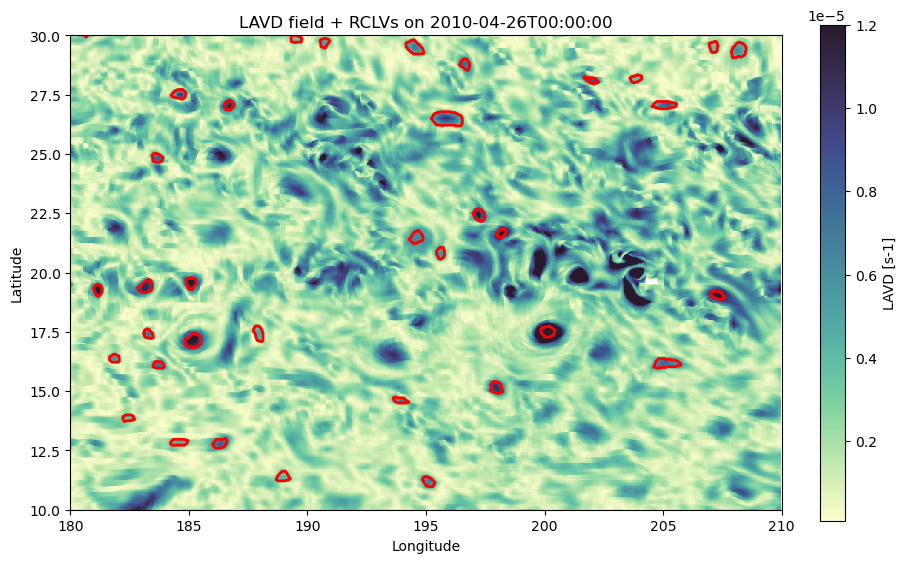

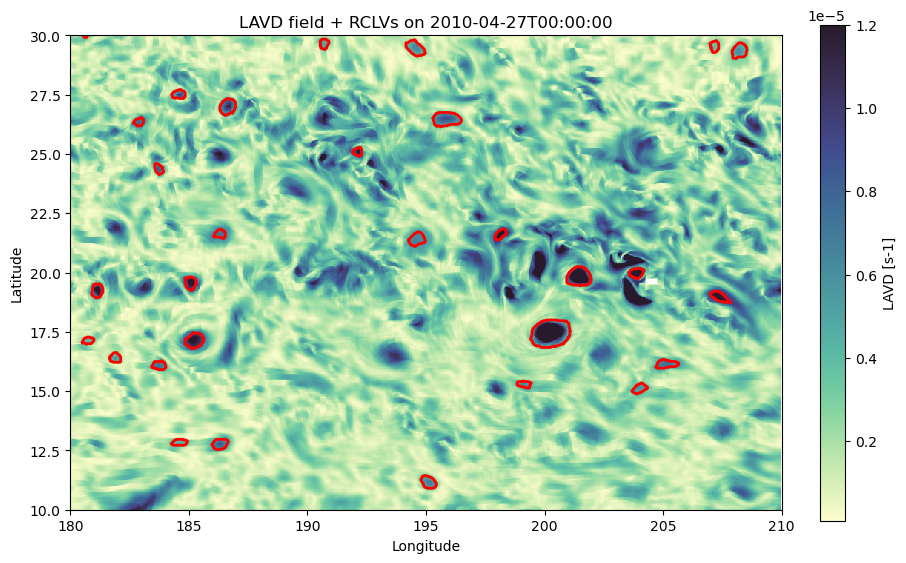

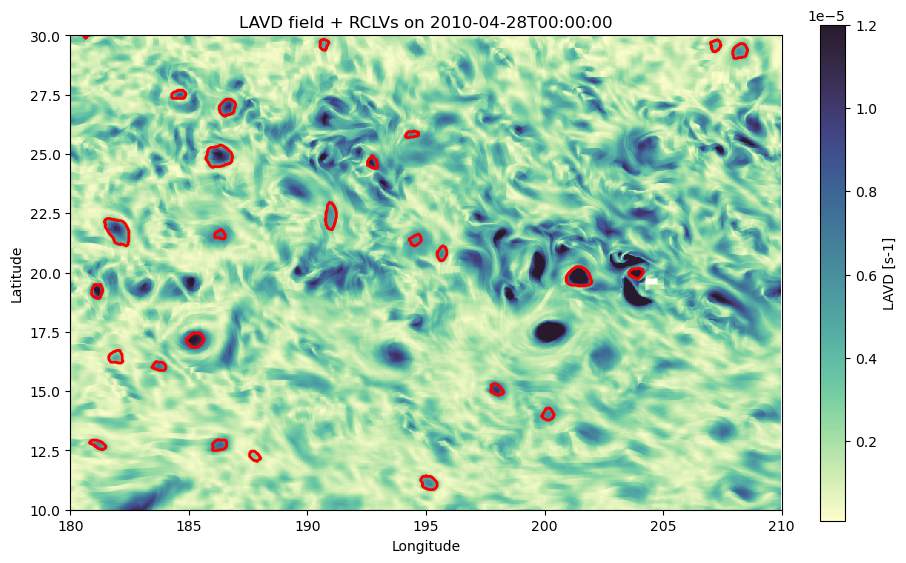

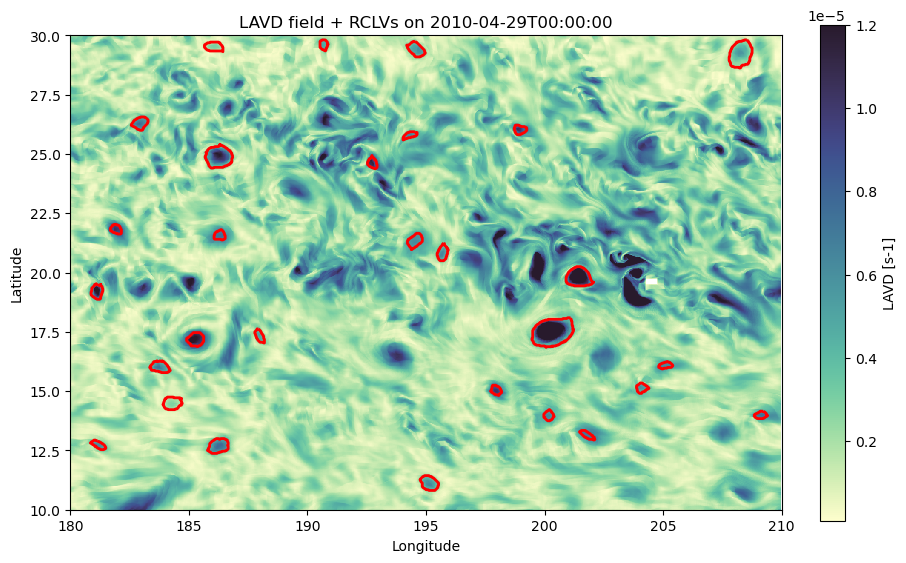

KeyboardInterrupt: 

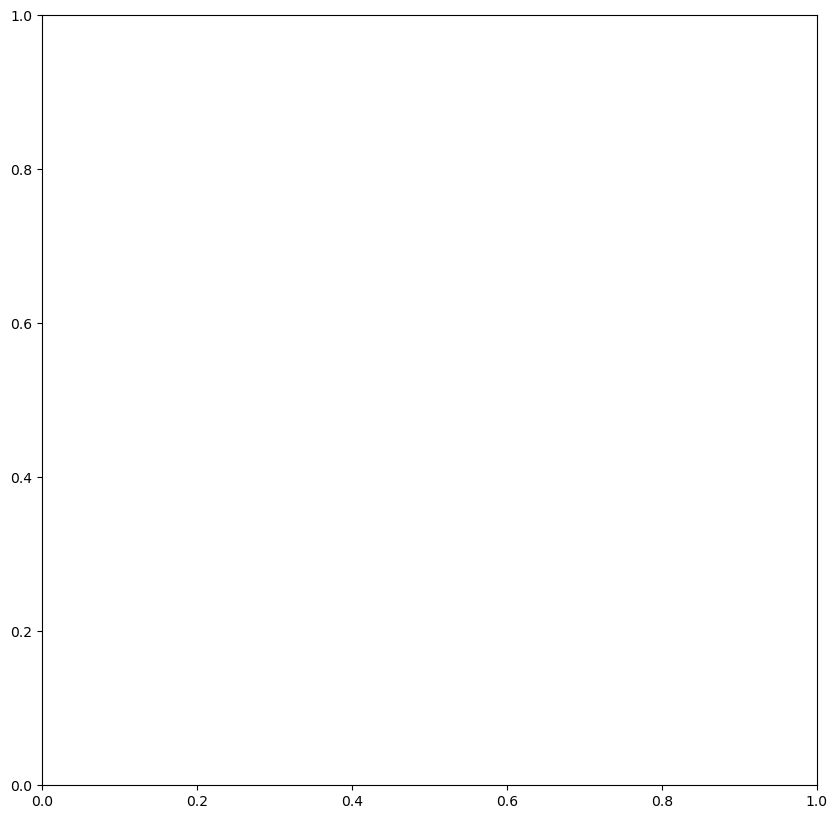

In [10]:

for i in np.unique(rclv['date']):
    fig, ax = plt.subplots(figsize=(10, 10))

    # select RCLVs
    subbie = rclv.where(rclv["date"] == i)
    gdf = gpd.GeoDataFrame(subbie, geometry='Polygon')
    # select LAVD field
    LAVD_day = lavd.sel(time = i)
    data_switched = LAVD_day.transpose("latitude", "longitude")

    
    LAVD_plot = data_switched.LAVD.plot(cmap=cmocean.cm.deep, vmin=10**(-7), vmax=1.2*(10**(-5)), add_colorbar = False )
    # color=plt.cm.Blues(norm(i))

    cbar = fig.colorbar(LAVD_plot, ax=ax, fraction = 0.032)
    cbar.set_label('LAVD [s-1]')
    
    gdf.plot(ax=ax, edgecolor="red", facecolor='none', lw=2)
    plt.title("LAVD field + RCLVs on %s"%(i))
    plt.xlim([180, 210])  
    plt.ylim([10, 30])
    ax.set_xlabel('Longitude', fontsize=10)
    ax.set_ylabel('Latitude', fontsize=10)
    ax.tick_params(axis='both', which='major', labelsize=10)

## save 
    date_obj = datetime.datetime.strptime(i, "%Y-%m-%dT%H:%M:%S")
    formatted_date = date_obj.strftime("%Y%m%d")
    
    # plt.savefig('/home/b/b382618/eddy_figs/trajectories/LAVD_days_RCLVs/f32/'+str(formatted_date)+ '_RCLVs_LAVD.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

## 3. plot all identified RCLVs at all time steps

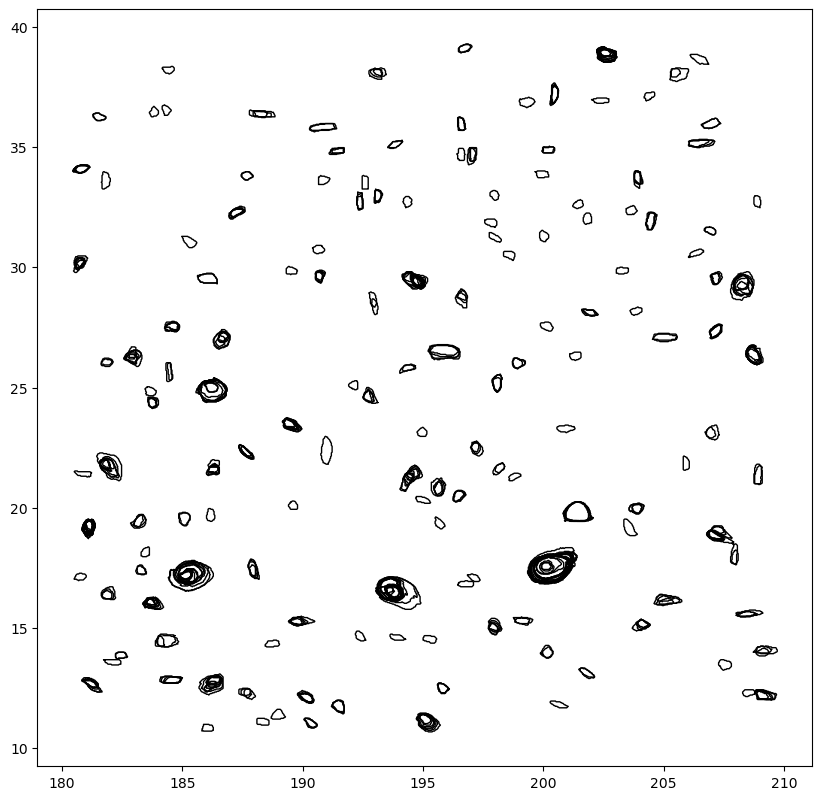

In [12]:
gdf = gpd.GeoDataFrame(rclv, geometry='Polygon')
fig, ax = plt.subplots(figsize=(10, 10))
# plt.xlim([198, 205])  
# plt.ylim([17, 22])
gdf.plot(ax=ax, edgecolor='black', facecolor='none')
plt.show()

## 4. individual eddy plots with lavd_days rclvs

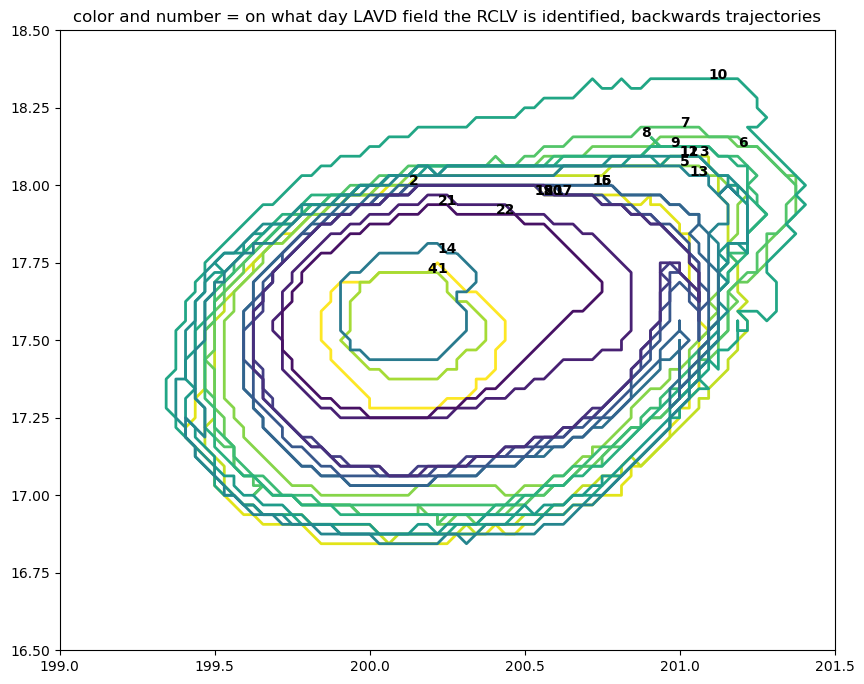

In [18]:
norm = colors.Normalize(vmin=min(rclv['age_order']), vmax=max(rclv['age_order']))

gdf = gpd.GeoDataFrame(rclv, geometry='Polygon')
fig, ax = plt.subplots(figsize=(10, 10))
plt.xlim([199, 201.5])  
plt.ylim([16.5, 18.5])

### select only the eddies within the area

# Add labels for each polygon in f_day
for idx, row in gdf.iterrows():
    # centroid = row['Polygon'].coords
    xx, yy = row['Polygon'].exterior.coords.xy
    x=xx[0]
    y=yy[0]
    plt.text(x, y, str(row['age_order']), fontsize=10, ha='right', color="black", weight='bold').set_clip_on(True)

gdf.plot(ax=ax, edgecolor=plt.cm.viridis_r(norm(rclv['age_order'])), facecolor='none', lw=2)
plt.title("color and number = on what day LAVD field the RCLV is identified, backwards trajectories")

plt.show()

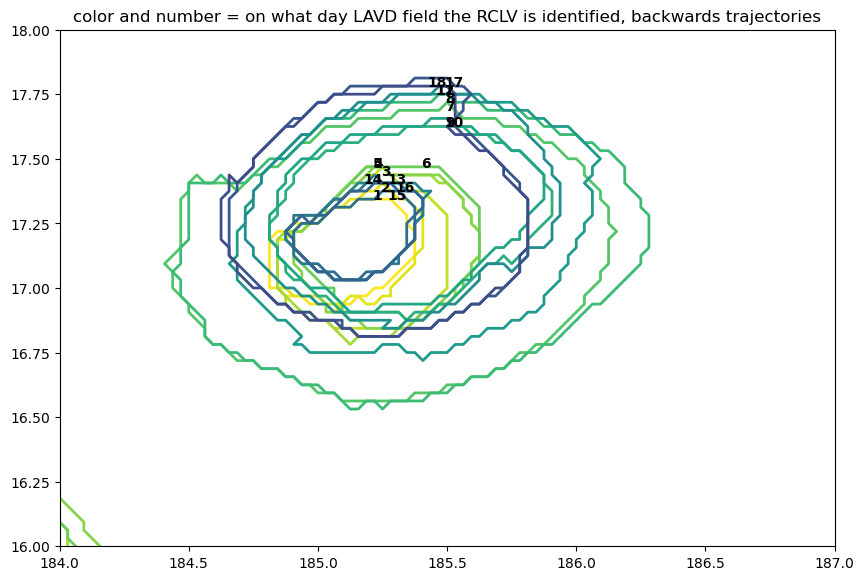

In [19]:
norm = colors.Normalize(vmin=min(rclv['age_order']), vmax=max(rclv['age_order']))

gdf = gpd.GeoDataFrame(rclv, geometry='Polygon')
fig, ax = plt.subplots(figsize=(10, 10))
plt.xlim([184, 187])  
plt.ylim([16, 18])

### select only the eddies within the area

# Add labels for each polygon in f_day
for idx, row in gdf.iterrows():
    # centroid = row['Polygon'].coords
    xx, yy = row['Polygon'].exterior.coords.xy
    x=xx[0]
    y=yy[0]
    plt.text(x, y, str(row['age_order']), fontsize=10, ha='right', color="black", weight='bold').set_clip_on(True)

gdf.plot(ax=ax, edgecolor=plt.cm.viridis_r(norm(rclv['age_order'])), facecolor='none', lw=2)
plt.title("color and number = on what day LAVD field the RCLV is identified, backwards trajectories")

plt.show()

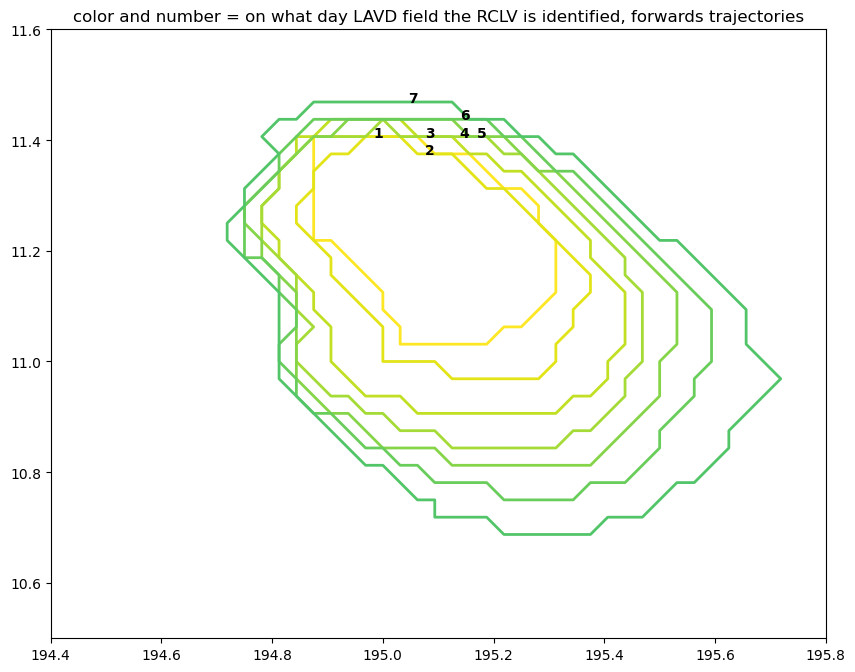

In [20]:
norm = colors.Normalize(vmin=min(rclv['age_order']), vmax=max(rclv['age_order']))

gdf = gpd.GeoDataFrame(rclv, geometry='Polygon')
fig, ax = plt.subplots(figsize=(10, 10))
plt.xlim([194.4, 195.8])  
plt.ylim([10.5, 11.6])

### select only the eddies within the area

# Add labels for each polygon in f_day
for idx, row in gdf.iterrows():
    # centroid = row['Polygon'].coords
    xx, yy = row['Polygon'].exterior.coords.xy
    x=xx[0]
    y=yy[0]
    plt.text(x, y, str(row['age_order']), fontsize=10, ha='right', color="black", weight='bold').set_clip_on(True)

gdf.plot(ax=ax, edgecolor=plt.cm.viridis_r(norm(rclv['age_order'])), facecolor='none', lw=2)
plt.title("color and number = on what day LAVD field the RCLV is identified, forwards trajectories")

plt.show()

## 5. age_order vs RCLV area

In [21]:
rclv['area_km2'] = pd.to_numeric(rclv['area_km2'], errors='coerce')


In [23]:
age_group_area = rclv.groupby('age_order')["area_km2"].mean()

In [24]:
number_of_eddies = rclv.groupby('age_order').count()

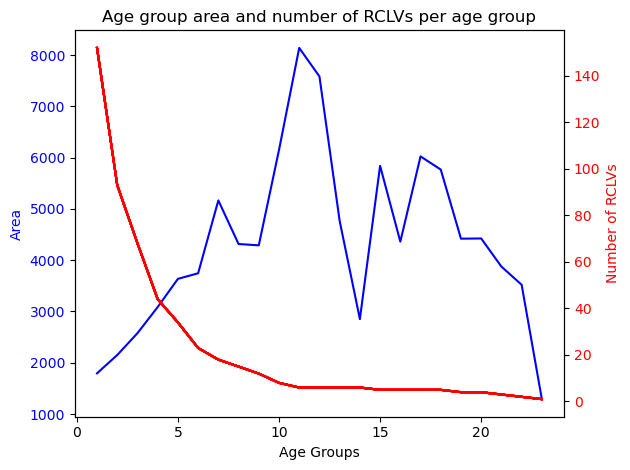

In [26]:

# Create the figure and axis
fig, ax1 = plt.subplots()

# Plot the first dataset
ax1.plot(np.unique(rclv['age_order']), age_group_area, label='Area', color='blue')
ax1.set_xlabel('Age Groups')
ax1.set_ylabel('Area', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis
ax2 = ax1.twinx()
ax2.plot(np.unique(rclv['age_order']), number_of_eddies, label='Number of RCLVs with this age', color='red')
ax2.set_ylabel('Number of RCLVs', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Add legends
# fig.legend(loc='upper right', bbox_to_anchor=(1, 0.9))

# Show the plot
plt.title('Age group area and number of RCLVs per age group')
plt.tight_layout()
plt.show()

## 6. animation with RCLVs appearing in age_order wit age_order colors

Creating figure for age_order 1


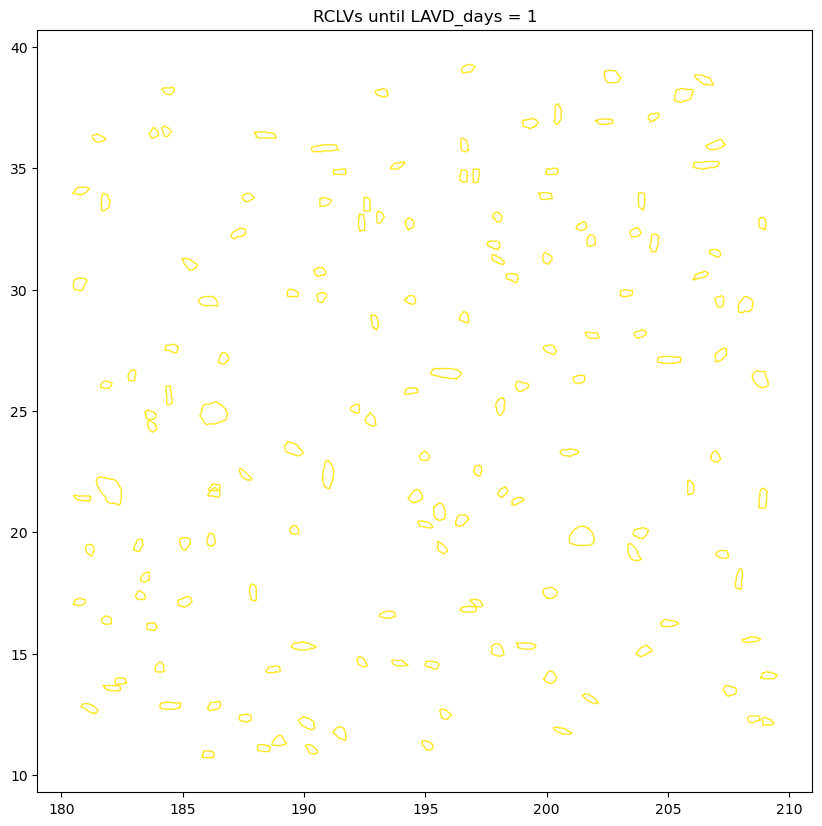

Creating figure for age_order 2


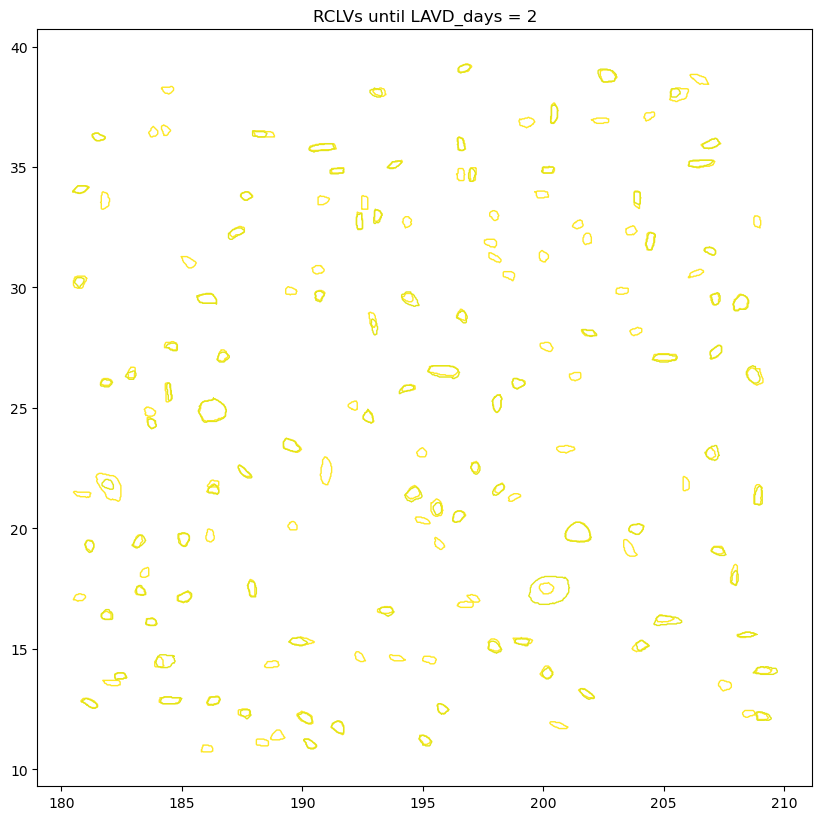

Creating figure for age_order 3


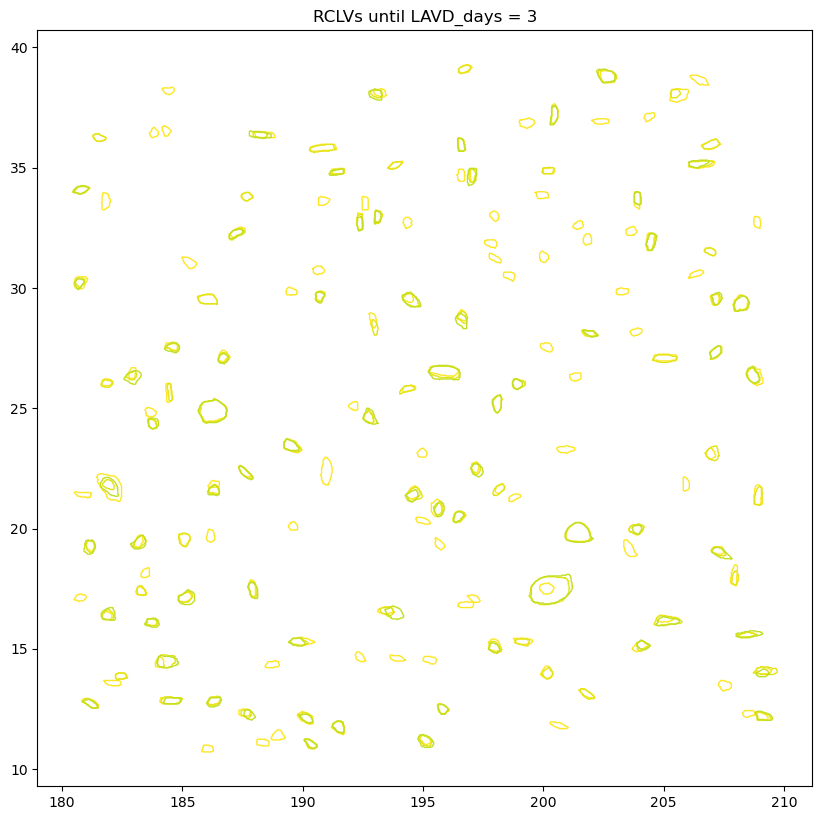

Creating figure for age_order 4


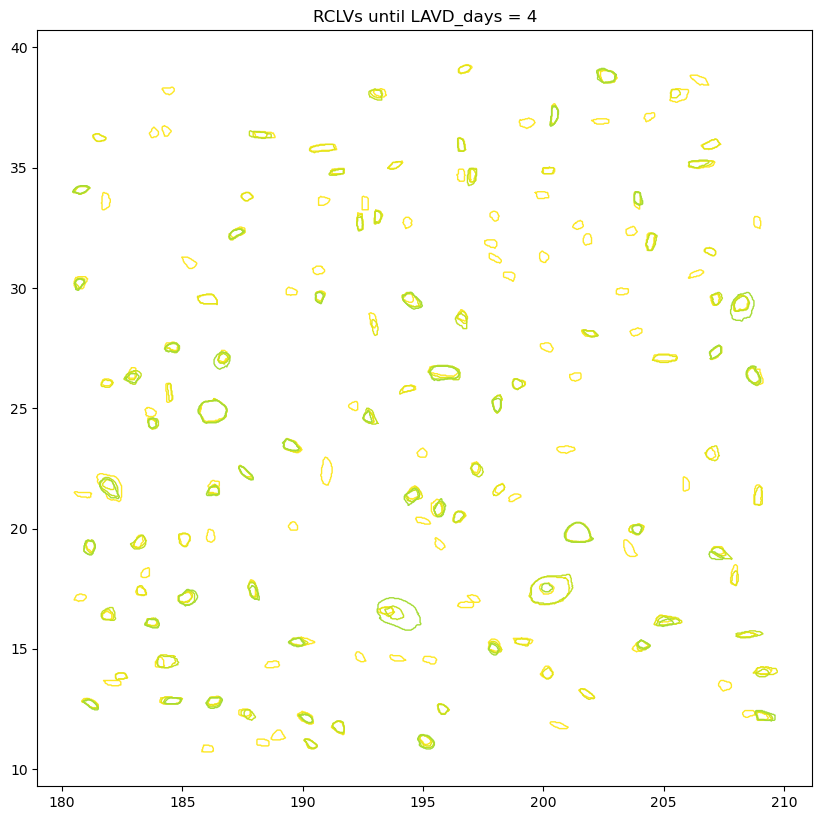

Creating figure for age_order 5


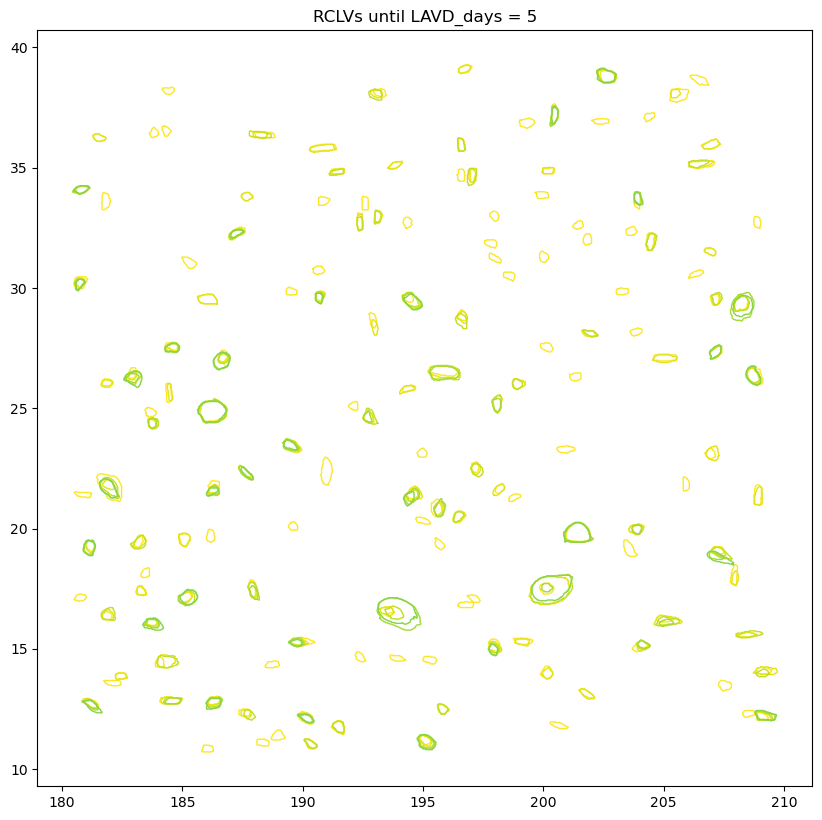

Creating figure for age_order 6


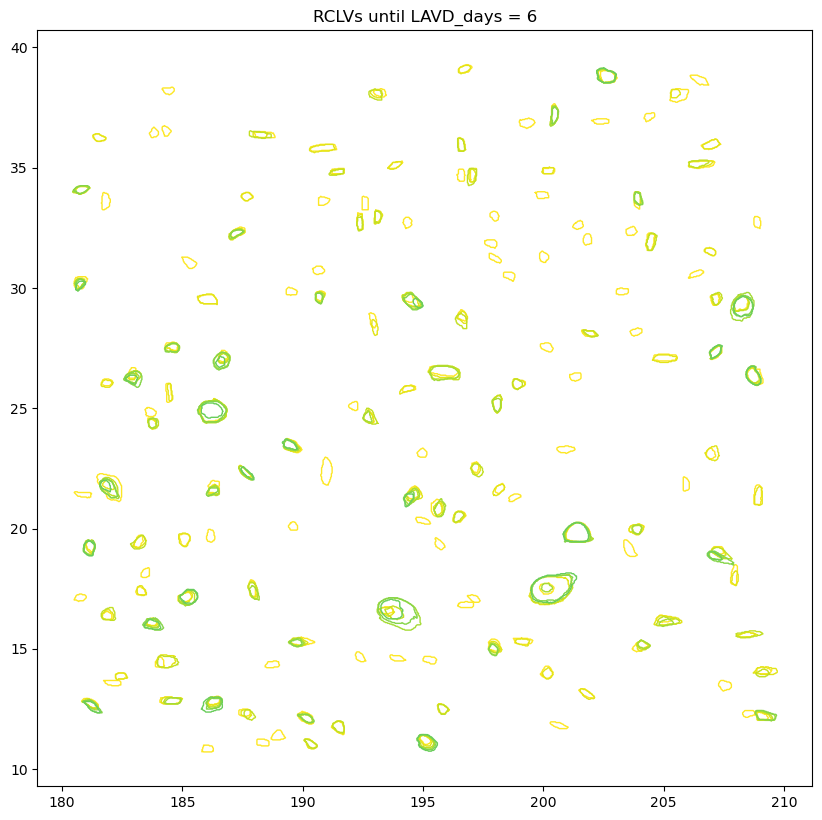

Creating figure for age_order 7


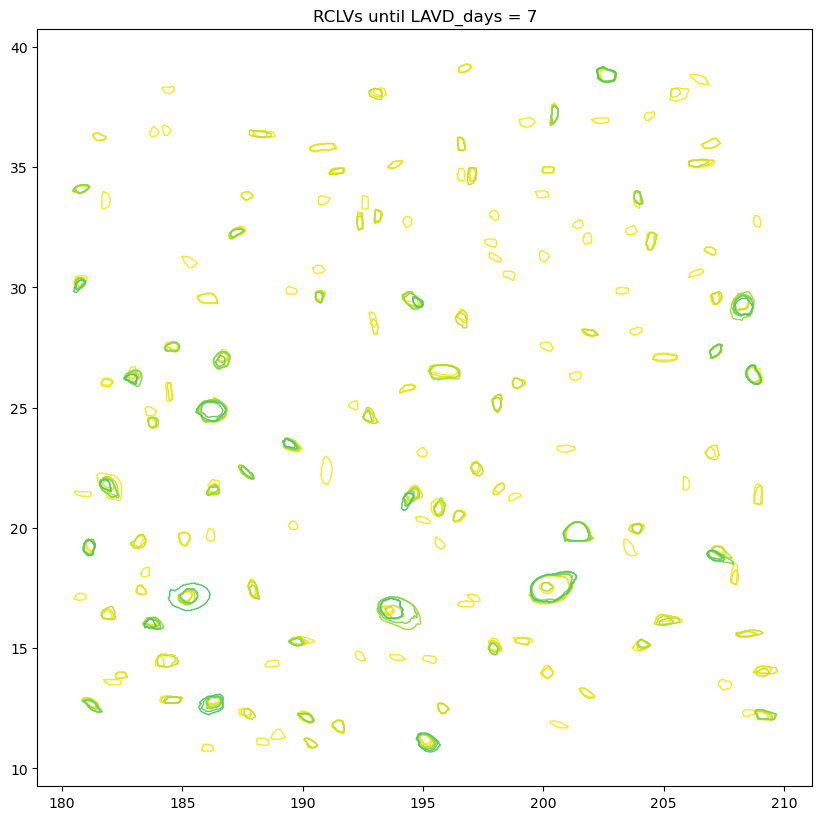

Creating figure for age_order 8


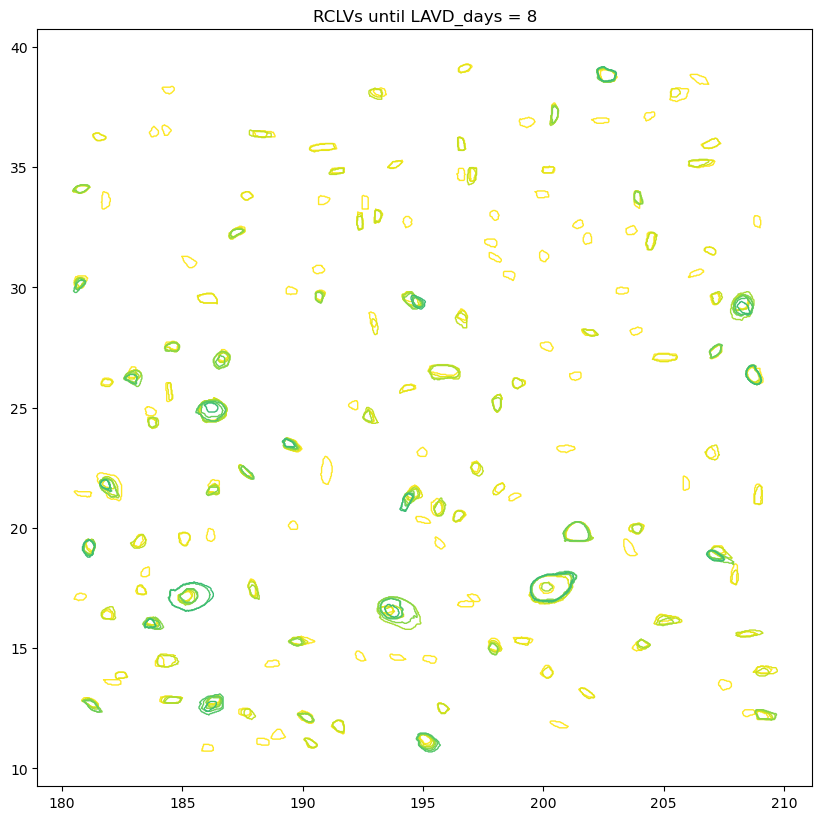

Creating figure for age_order 9


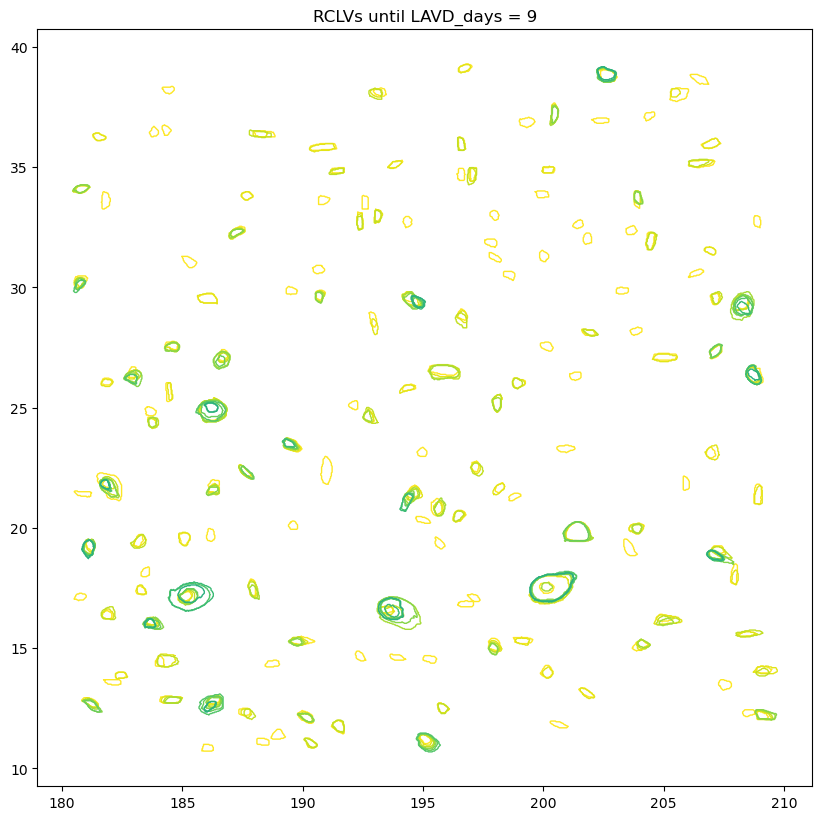

Creating figure for age_order 10


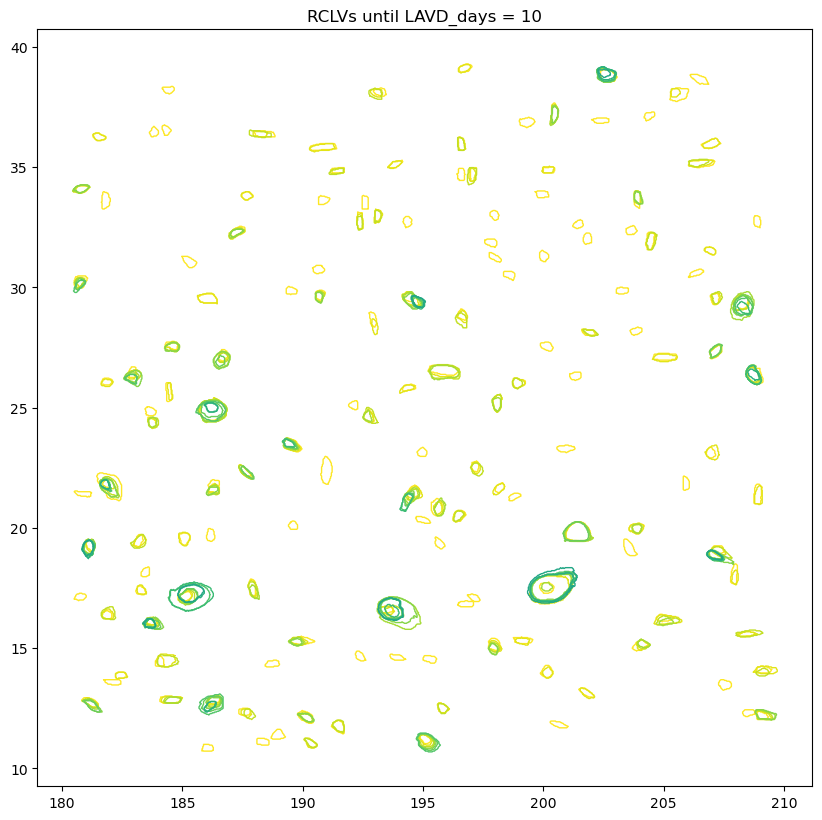

Creating figure for age_order 11


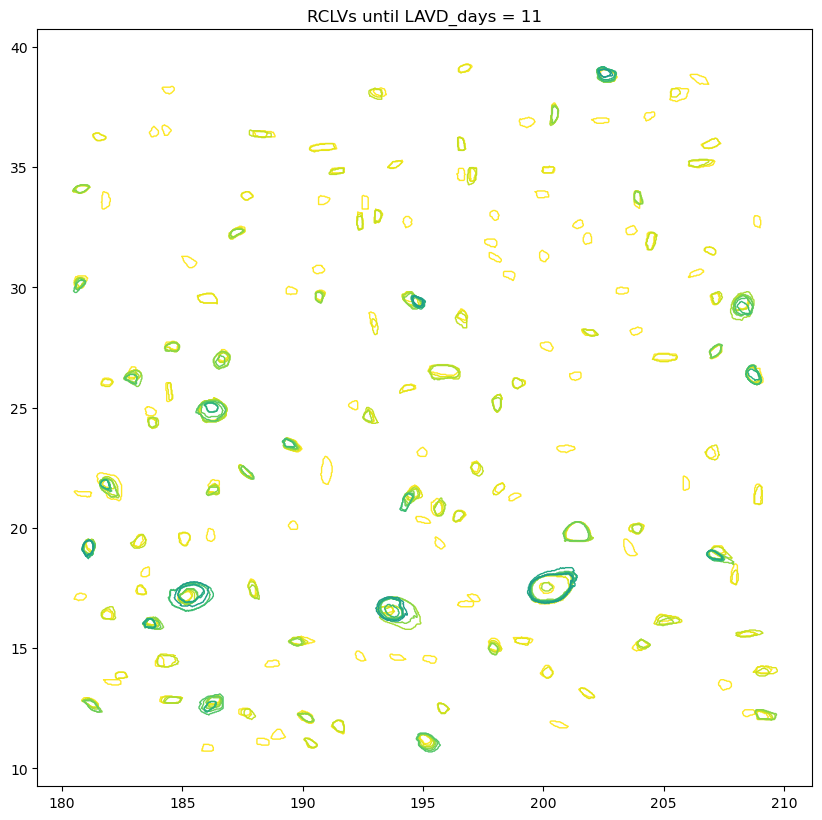

Creating figure for age_order 12


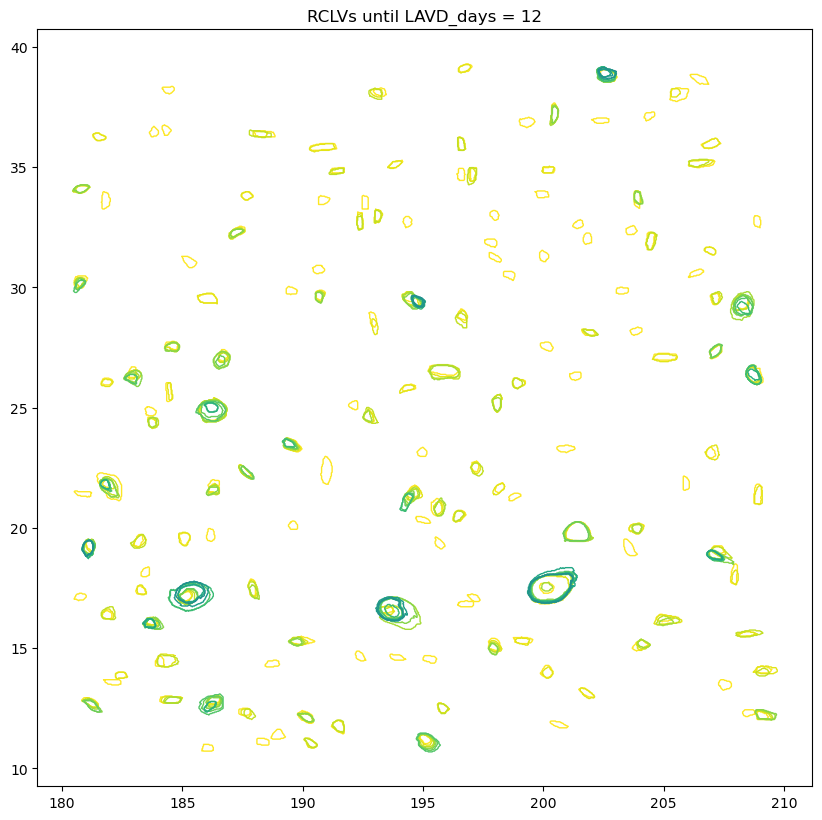

Creating figure for age_order 13


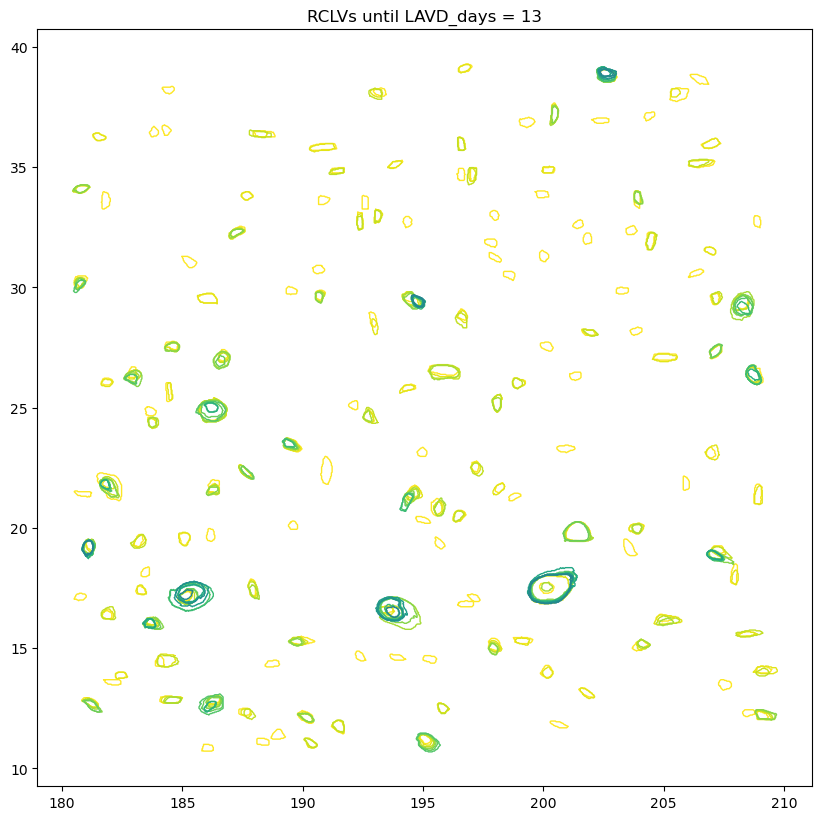

Creating figure for age_order 14


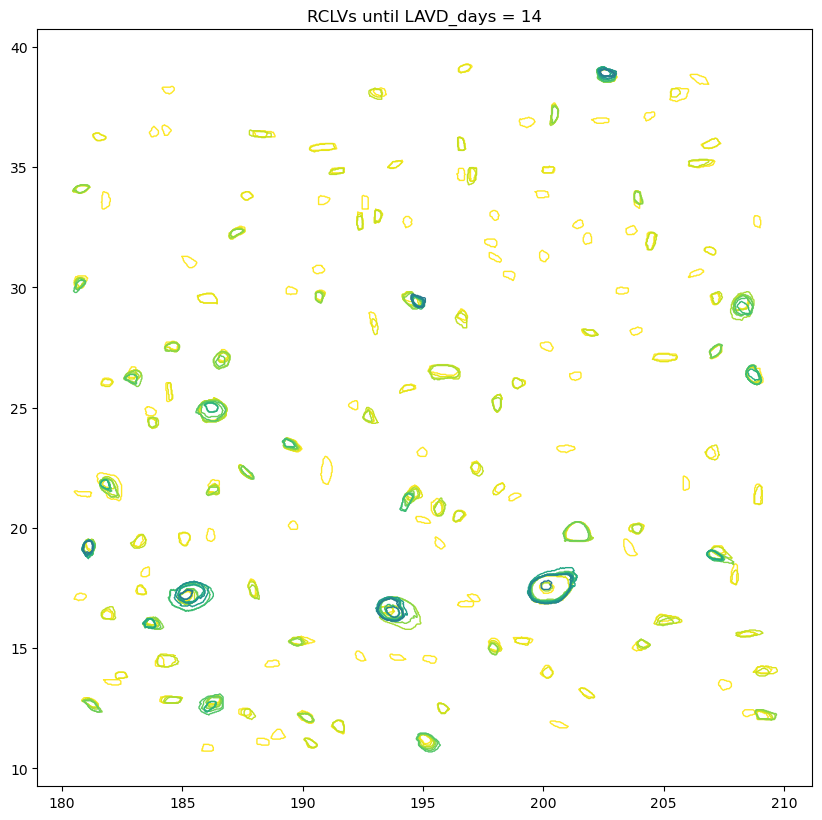

Creating figure for age_order 15


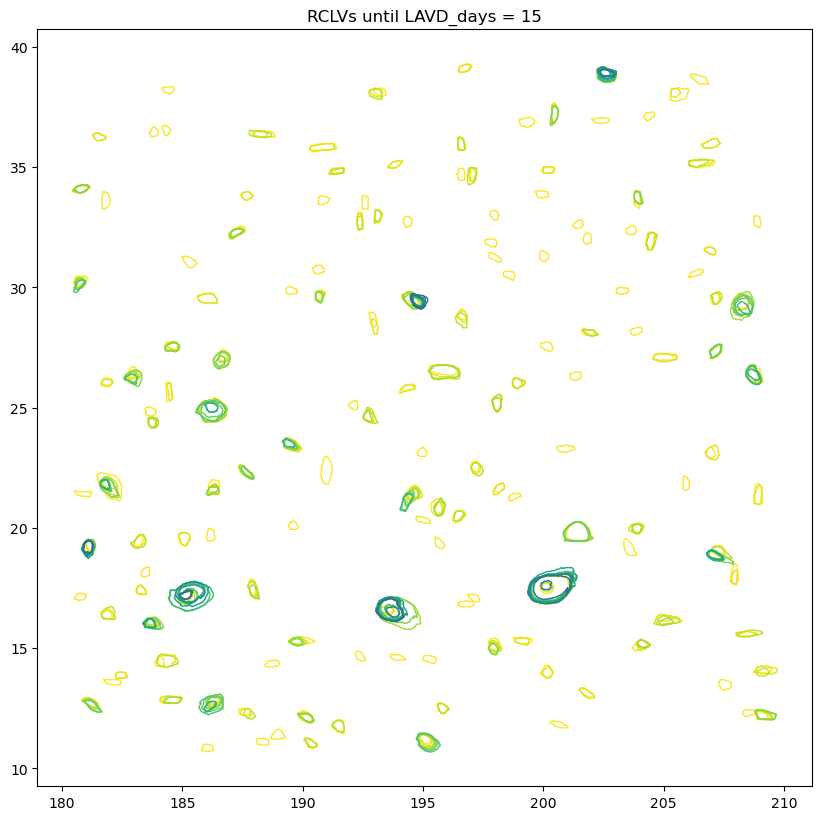

Creating figure for age_order 16


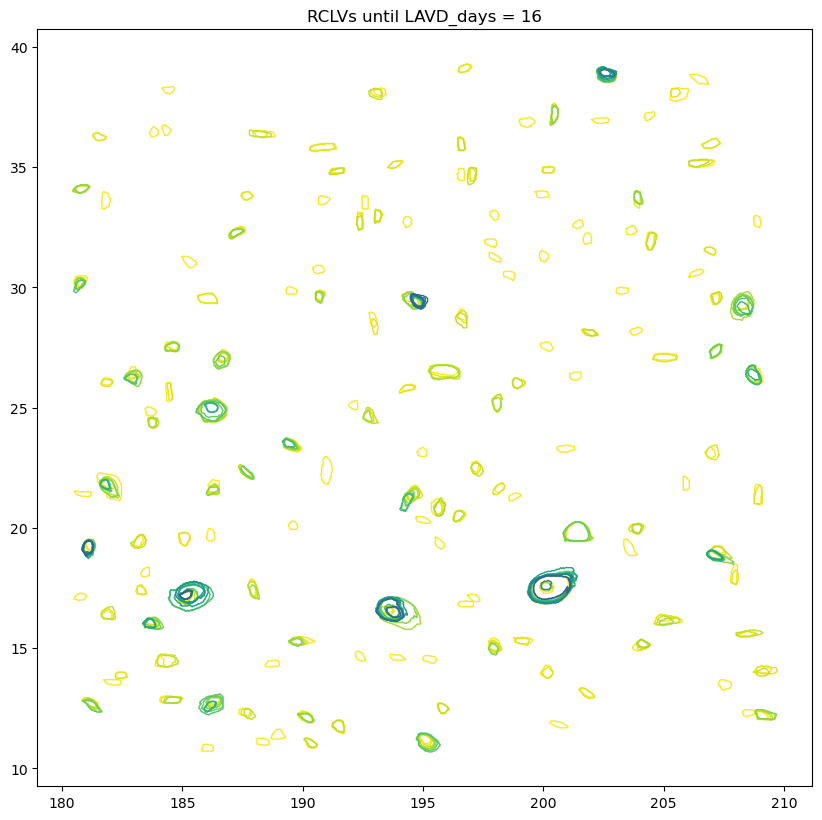

Creating figure for age_order 17


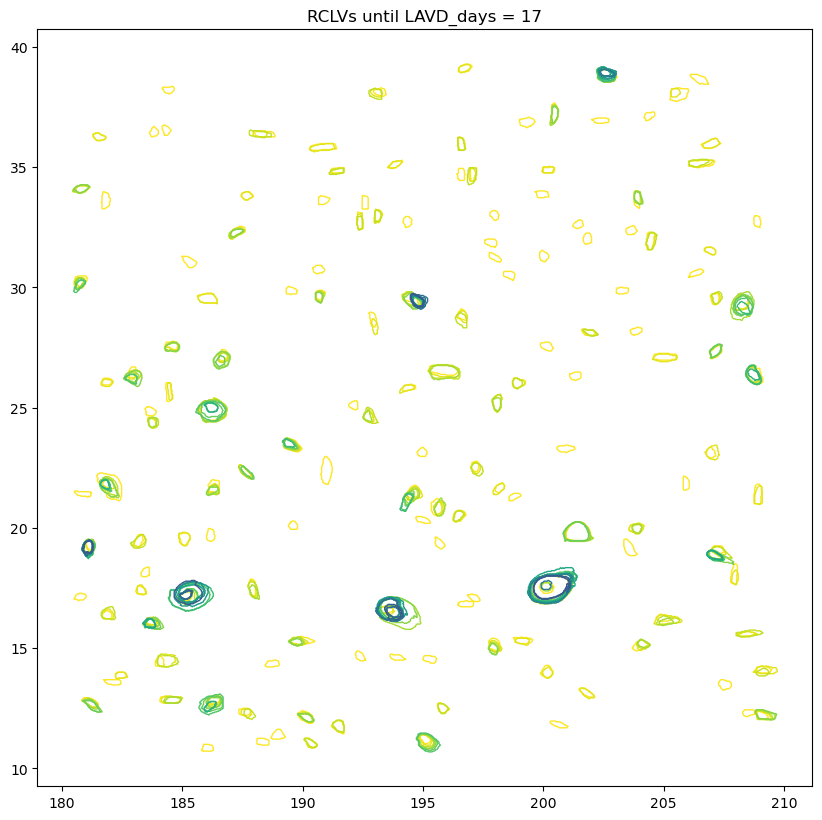

In [27]:
# import matplotlib.pyplot as plt
# import geopandas as gpd
# import numpy as np


''' chatgpt did this '''

from matplotlib import colors

# Normalize color range based on 'age_order'
norm = colors.Normalize(vmin=min(rclv['age_order']), vmax=max(rclv['age_order']))

# Create consecutive figures
for i in np.arange(1, 18):  # Assuming age_order ranges from 1 to 17
    print(f"Creating figure for age_order {i}")
    
    # Filter polygons with the current age_order
    eddy1 = rclv[rclv['age_order'] == i]
    gdf = gpd.GeoDataFrame(eddy1, geometry='Polygon')

    # Create the plot
    fig, ax = plt.subplots(figsize=(10, 10))
    # plt.xlim([184, 186.5])
    # plt.ylim([16.4, 18])
    plt.title(f"RCLVs until LAVD_days = {i}")

    # Loop through all age orders up to the current one to accumulate polygons
    for j in range(1, i + 1):
        eddy_subset = rclv[rclv['age_order'] == j]
        gdf_subset = gpd.GeoDataFrame(eddy_subset, geometry='Polygon')
        gdf_subset.plot(
            ax=ax,
            edgecolor=plt.cm.viridis_r(norm(j)),  # Color based on age_order
            facecolor='none',
            lw=1
        )
                # Add labels for each polygon
        # for idx, row in gdf_subset.iterrows():
        #     # Get the first point of the polygon's exterior for labeling
        #     xx, yy = row['Polygon'].exterior.coords.xy
        #     x = xx[0]
        #     y = yy[0]
        #     plt.text(
        #         x, y, str(row['date'])[0:10], 
        #         fontsize=10, ha='right', color="black", weight='bold'
        #     ).set_clip_on(True)

    # Display the figure
    # plt.savefig('/home/b/b382618/eddy_figs/trajectories/LAVD_days_RCLVs/one_eddy/all_eddies/'+str(i)+ '_RCLVs.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

    plt.show()


## 7. RCLVs and their group_ids

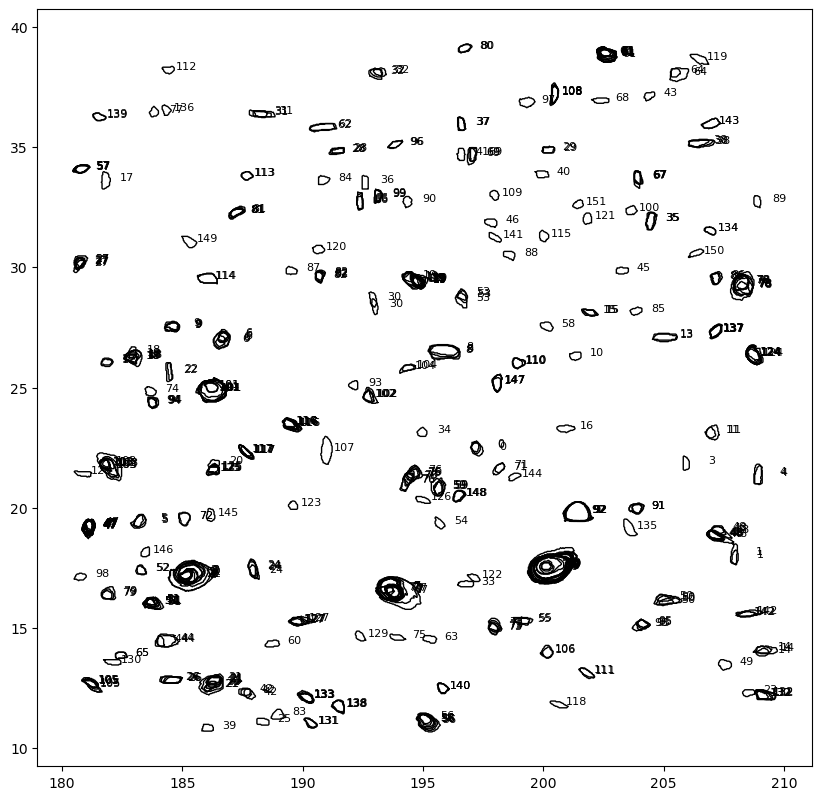

In [28]:
gdf = gpd.GeoDataFrame(rclv, geometry='Polygon')

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, edgecolor='black', facecolor='none')

# Add labels for each polygon in f_day
for idx, row in gdf.iterrows():
    centroid = row['Polygon'].centroid
    ax.text(centroid.x+1.2, centroid.y, str(row['group_id']), fontsize=8, ha='right')


plt.show()

## 8. plotting particles within a diverging RCLV

In [30]:
eddy= rclv[rclv['group_id']==56]
eddy

,date,RCLV_id,orientation,age_days,area_km2,center_lon,center_lat,CD,flag,Points,Polygon,group_id,age_order
6126,2010-04-25,nan,cyc,nan,1467.932957,195.09375,11.21875,0.029651103381313312,0,"['195.0', '11.40625', '195.03125', '11.40625',...","POLYGON ((195 11.40625, 195.03125 11.40625, 19...",56,1
12161,2010-04-26,nan,cyc,nan,1811.072916,195.15625,11.1875,0.02965545839828983,0,"['195.09375', '11.375', '195.125', '11.375', '...","POLYGON ((195.09375 11.375, 195.125 11.375, 19...",56,2
18311,2010-04-27,nan,cyc,nan,2983.453263,195.125,11.1875,0.020020401867683033,0,"['195.09375', '11.40625', '195.125', '11.40625...","POLYGON ((195.09375 11.40625, 195.125 11.40625...",56,3
23311,2010-04-28,nan,cyc,nan,3618.818612,195.15625,11.09375,0.019538462612891525,0,"['195.15625', '11.40625', '195.15625', '11.406...","POLYGON ((195.15625 11.40625, 195.15625 11.406...",56,4
27504,2010-04-29,nan,cyc,nan,4285.699968,195.125,11.0625,0.020223155949604152,0,"['195.1875', '11.40625', '195.21875', '11.4062...","POLYGON ((195.1875 11.40625, 195.21875 11.4062...",56,5
32291,2010-04-30,nan,cyc,nan,5042.439810,195.125,11.03125,0.01924393709118464,0,"['195.15625', '11.4375', '195.1875', '11.4375'...","POLYGON ((195.15625 11.4375, 195.1875 11.4375,...",56,6
36340,2010-05-01,nan,cyc,nan,6318.058182,195.21875,11.03125,0.029811049303558237,0,"['195.0625', '11.46875', '195.09375', '11.4687...","POLYGON ((195.0625 11.46875, 195.09375 11.4687...",56,7


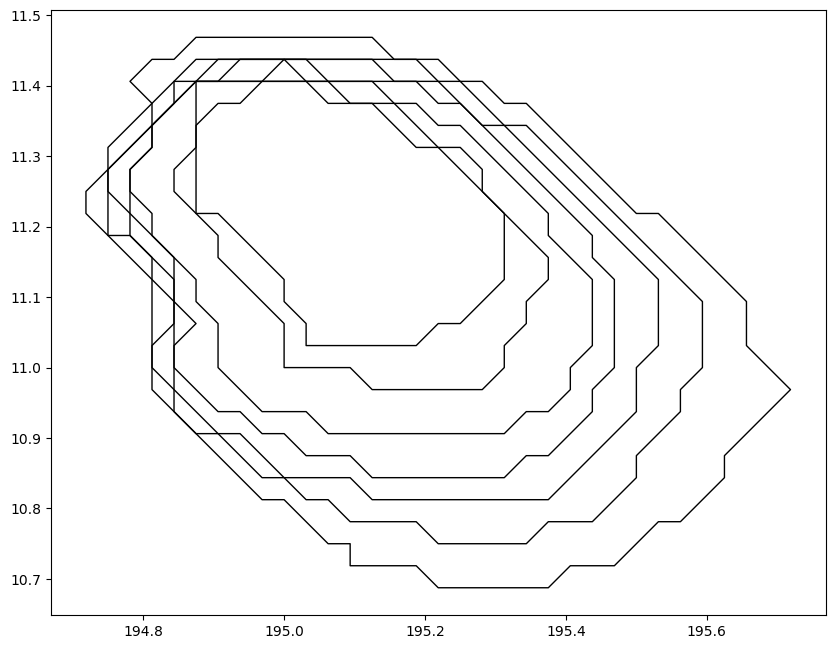

In [31]:
gdf = gpd.GeoDataFrame(eddy, geometry='Polygon')

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, edgecolor='black', facecolor='none')

# # Add labels for each polygon in f_day
# for idx, row in gdf.iterrows():
#     centroid = row['Polygon'].centroid
#     ax.text(centroid.x+1.2, centroid.y, str(row['group_id']), fontsize=8, ha='right')


plt.show()

In [32]:
traj_path= "/work/bk1377/b382618/RCLVs/f32day/lang_traj/20100423_32days_runtime_20min_timestep_particle_start_lat_10.0_40.0_lon_180.0_210.0_spatial_step_0.03125_6hr_output_freq.zarr"

In [33]:
traj=xr.open_zarr(traj_path)

In [34]:
# Extract latitude, longitude, and time or depth, assuming they're named as such
lons = traj['lon']  # Shape: (trajectory, obs)
lats = traj['lat']  # Shape: (trajectory, obs)
times = traj['time']  # Shape: (trajectory, obs), optional

<class 'numpy.datetime64'>


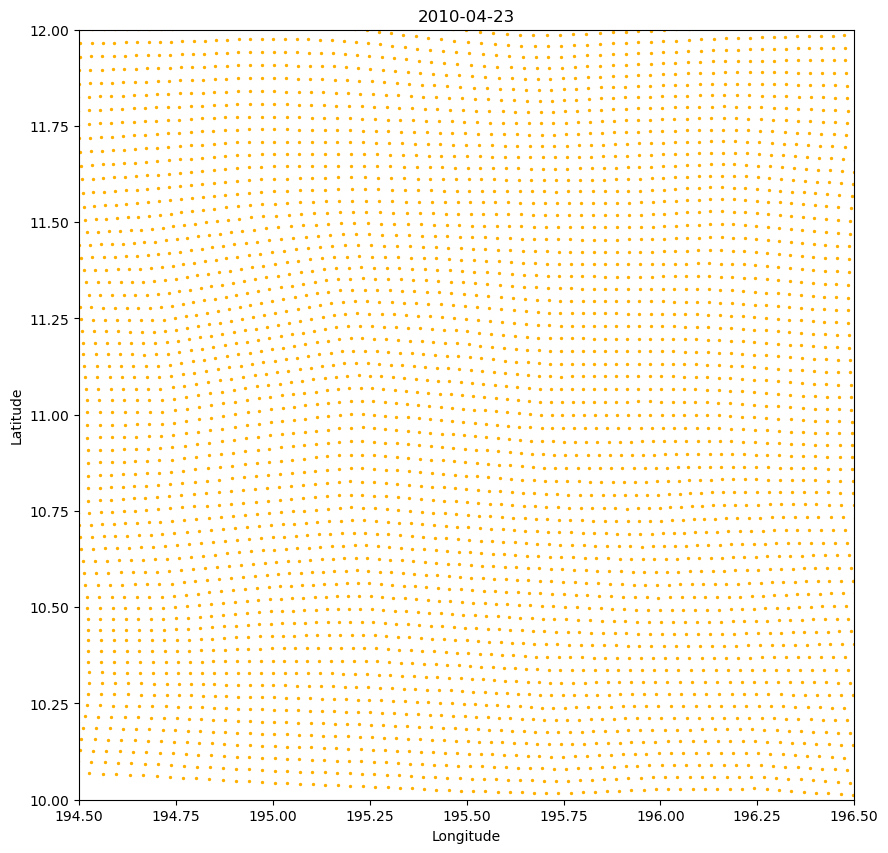

<class 'numpy.datetime64'>


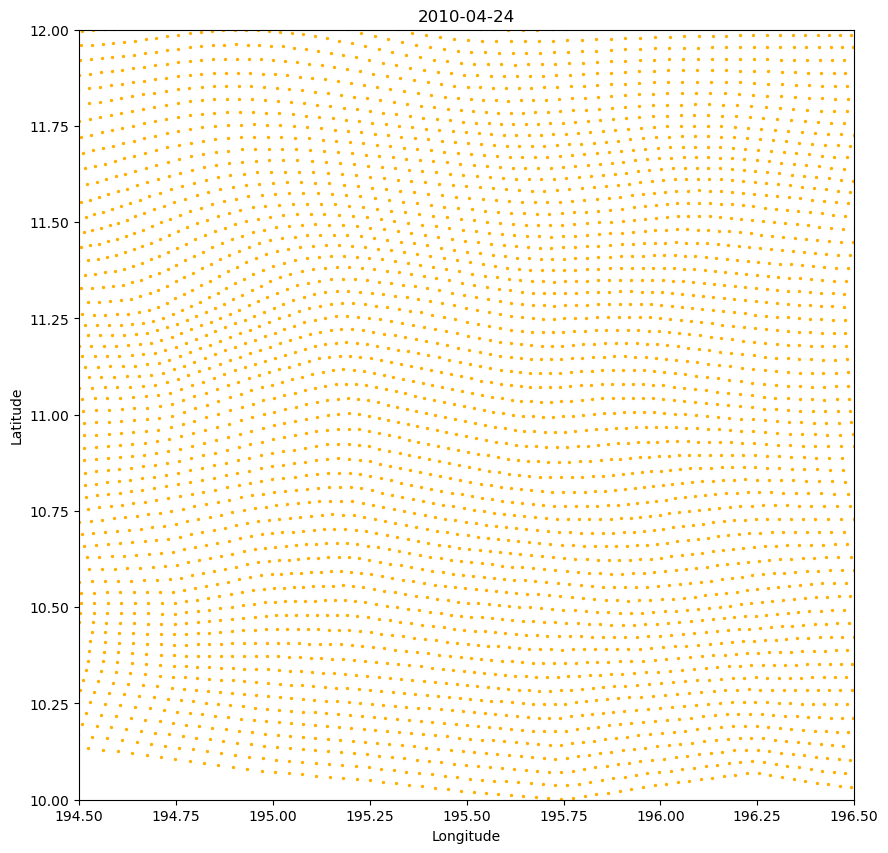

<class 'numpy.datetime64'>


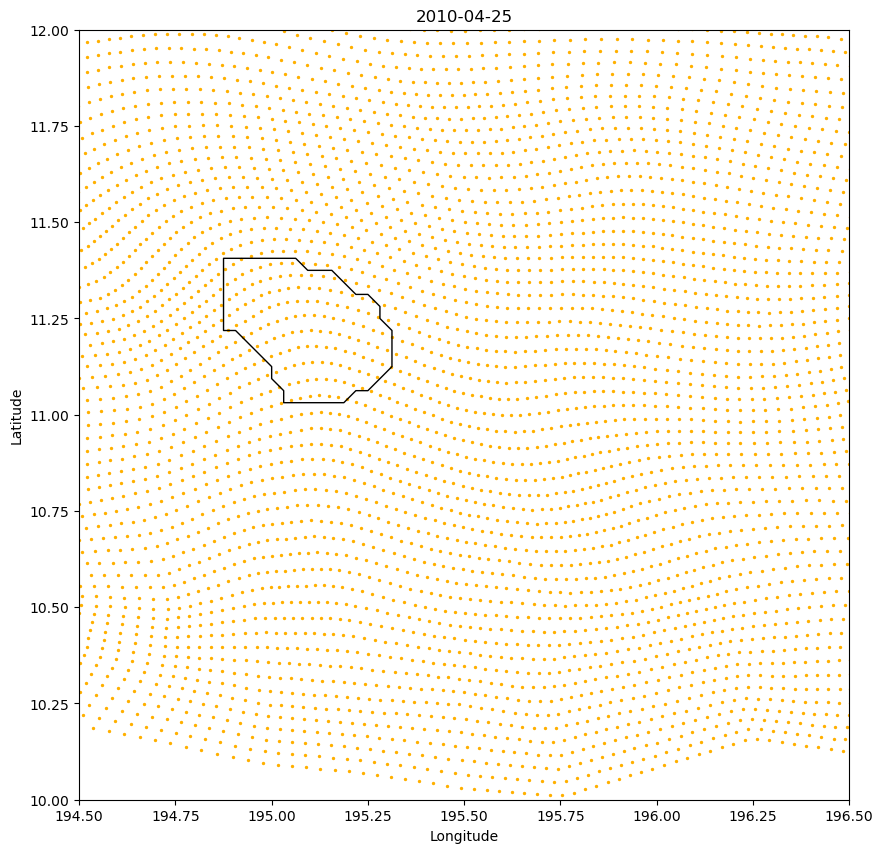

<class 'numpy.datetime64'>


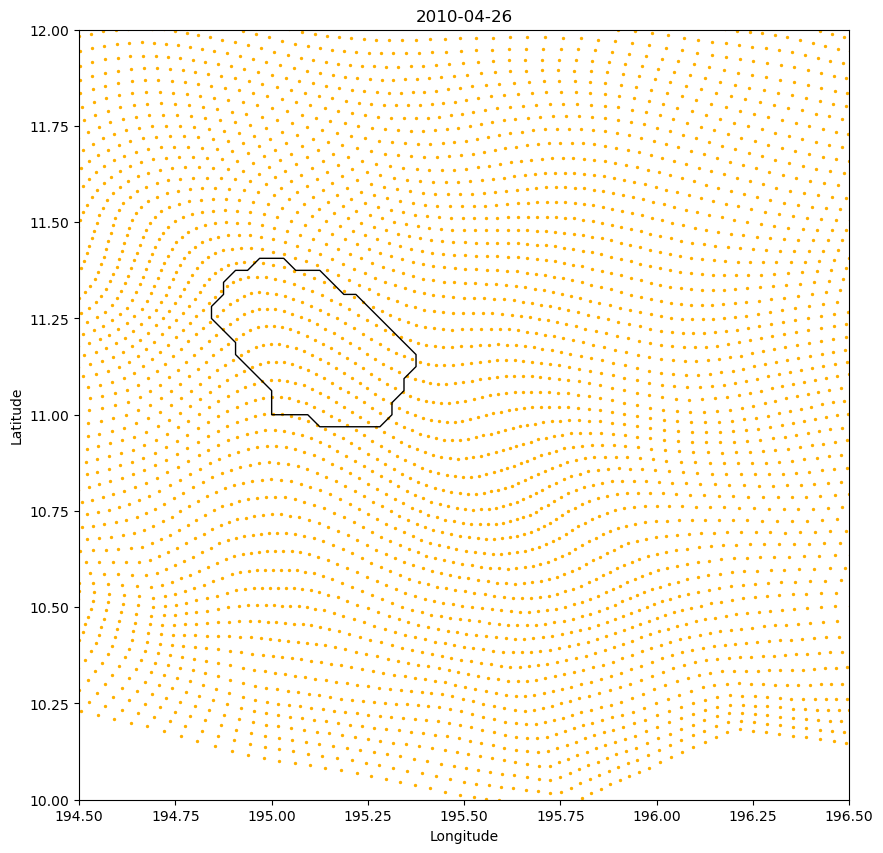

<class 'numpy.datetime64'>


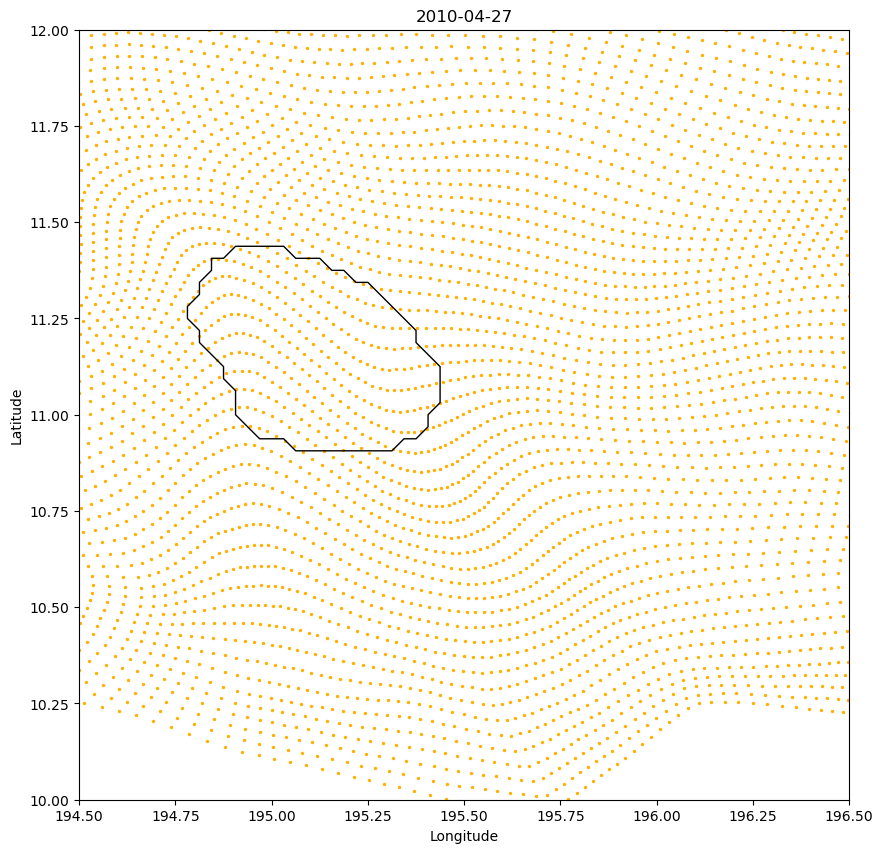

<class 'numpy.datetime64'>


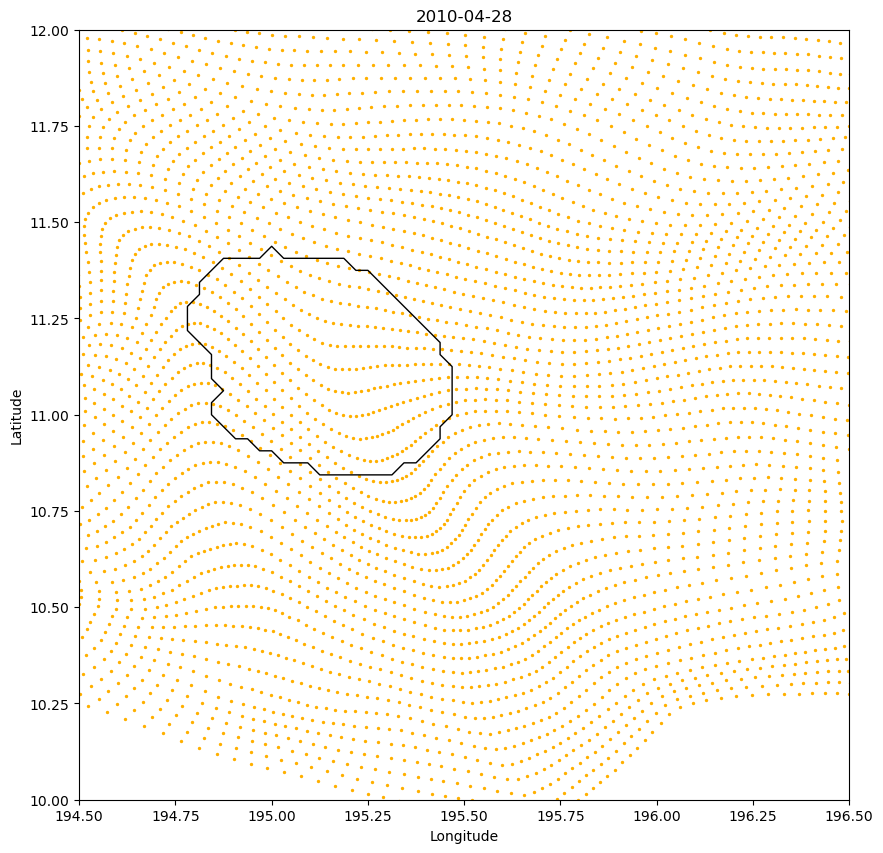

<class 'numpy.datetime64'>


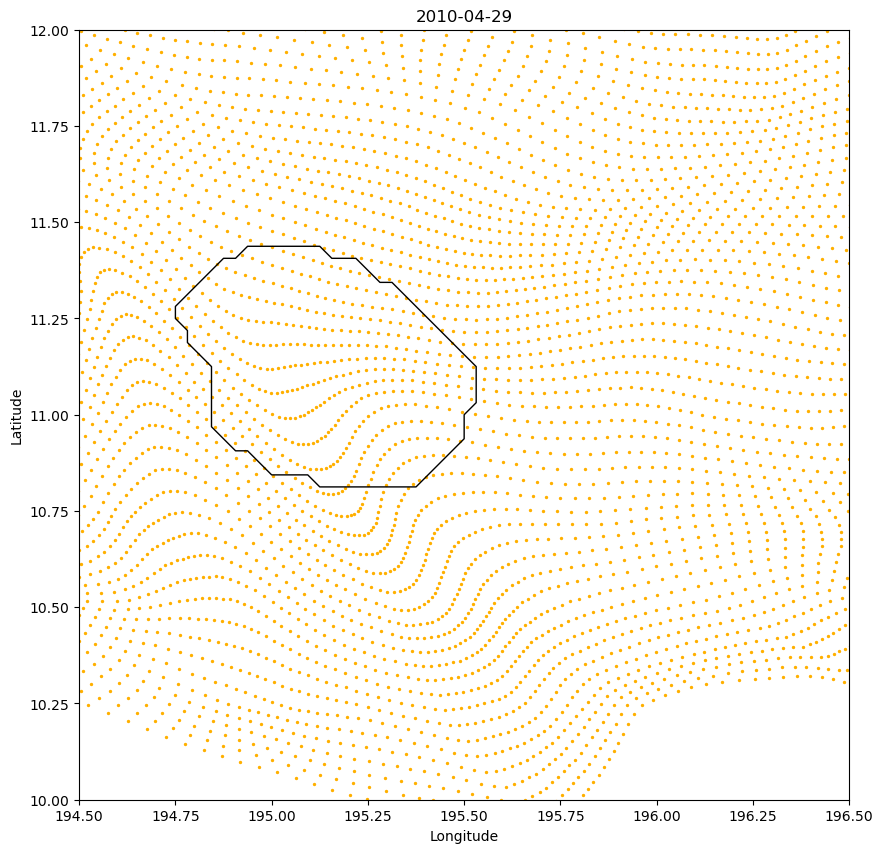

<class 'numpy.datetime64'>


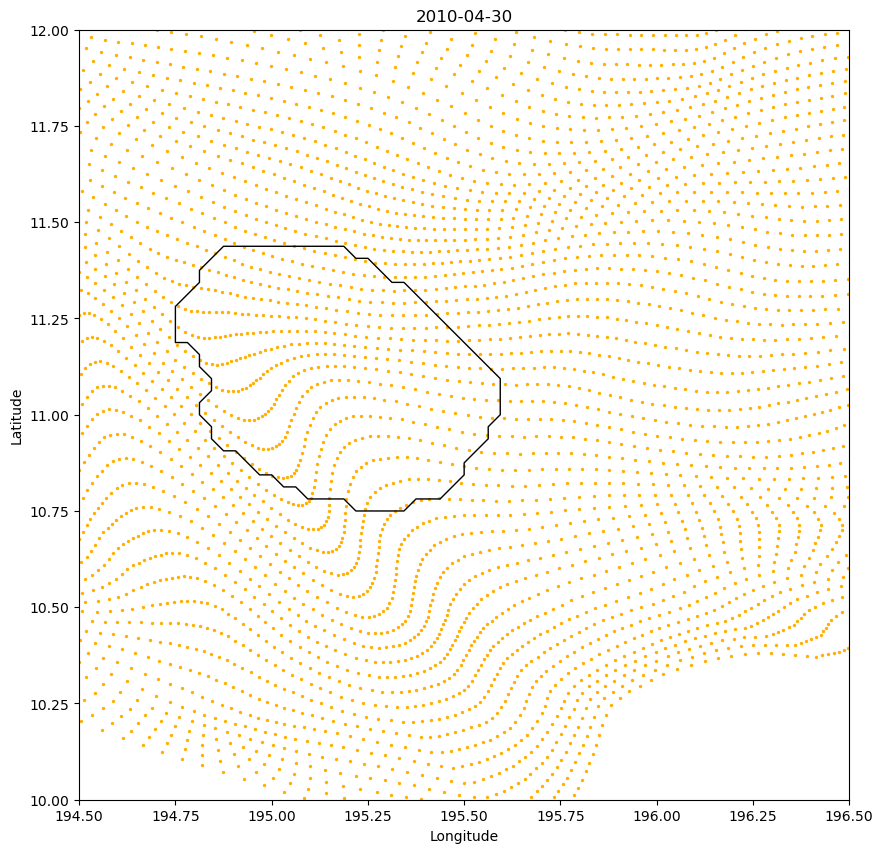

<class 'numpy.datetime64'>


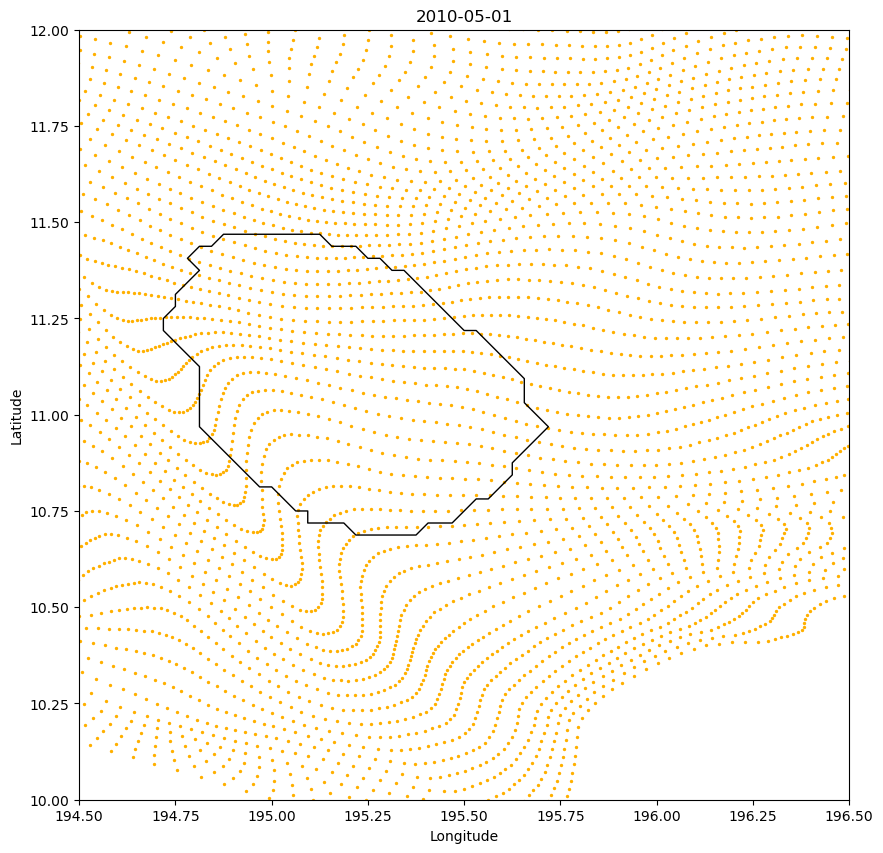

<class 'numpy.datetime64'>


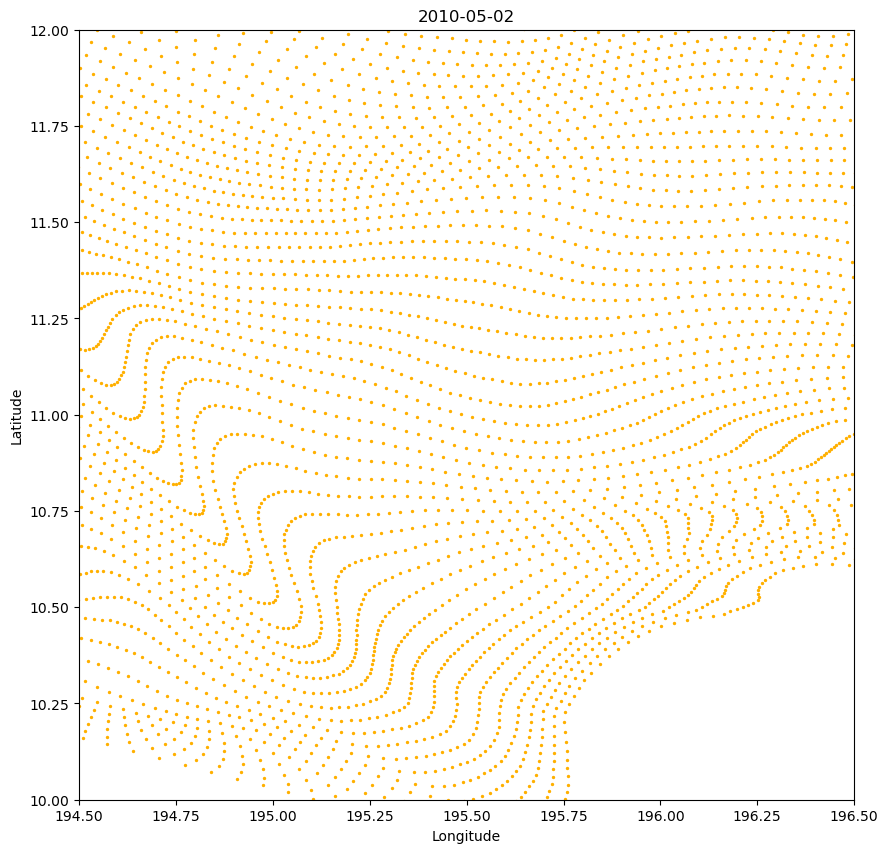

<class 'numpy.datetime64'>


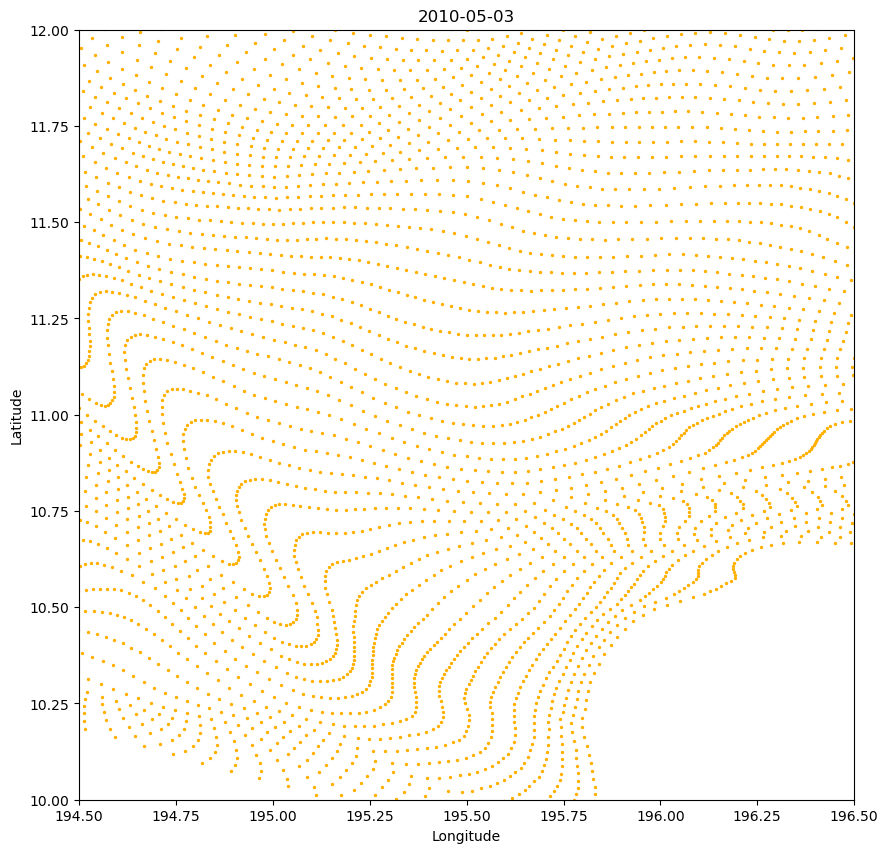

<class 'numpy.datetime64'>


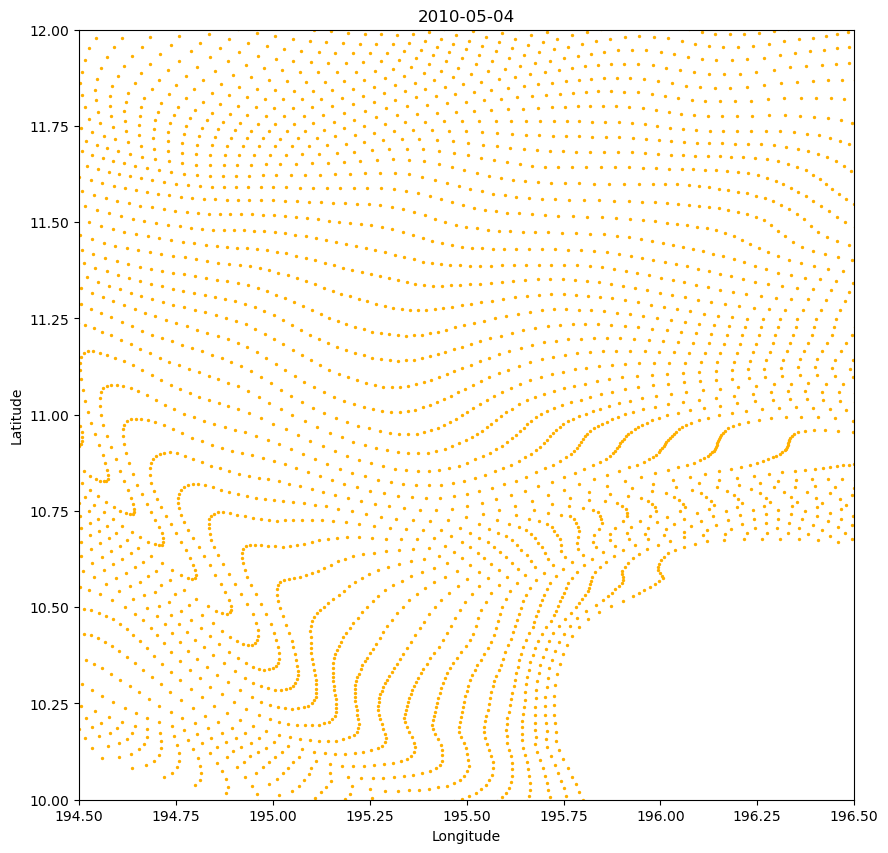

<class 'numpy.datetime64'>


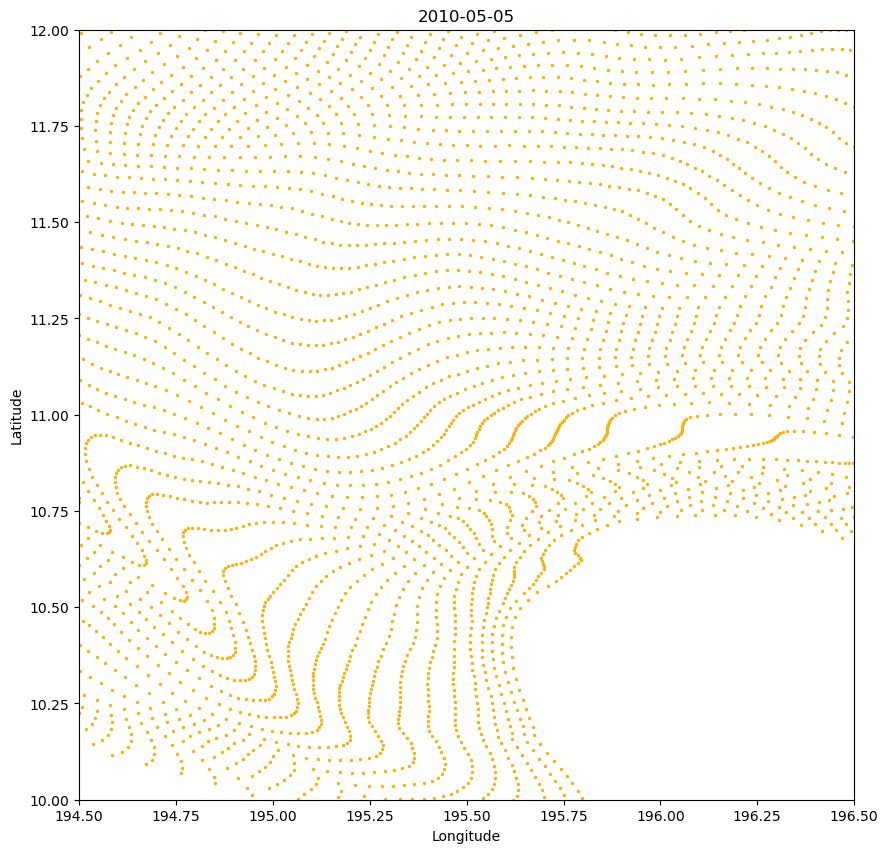

<class 'numpy.datetime64'>


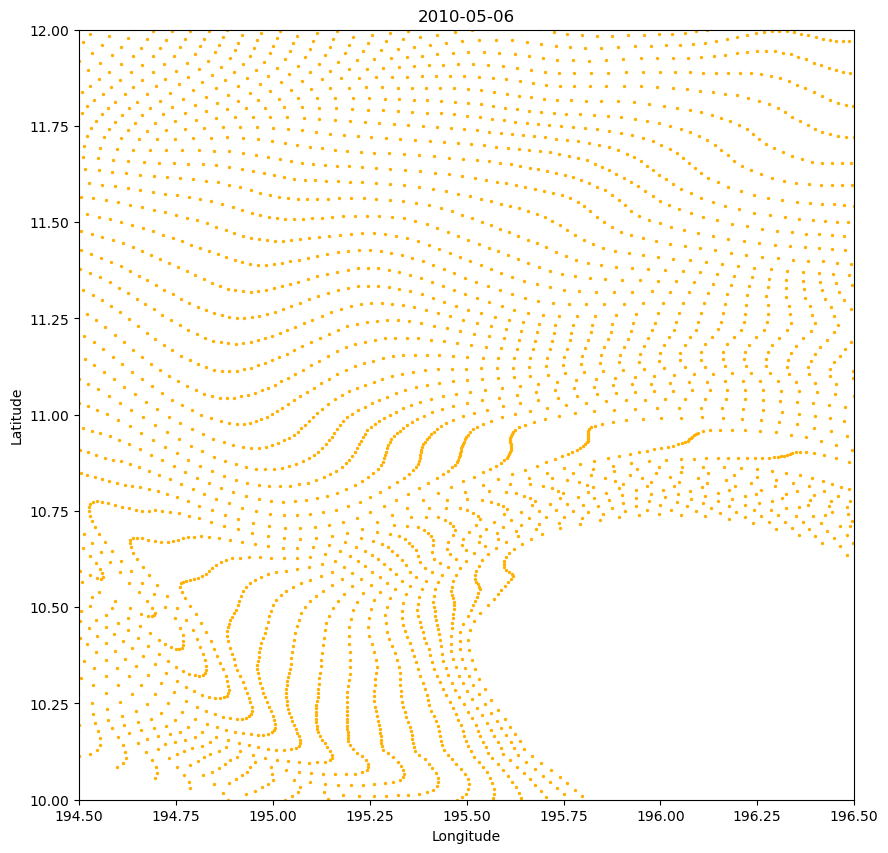

<class 'numpy.datetime64'>


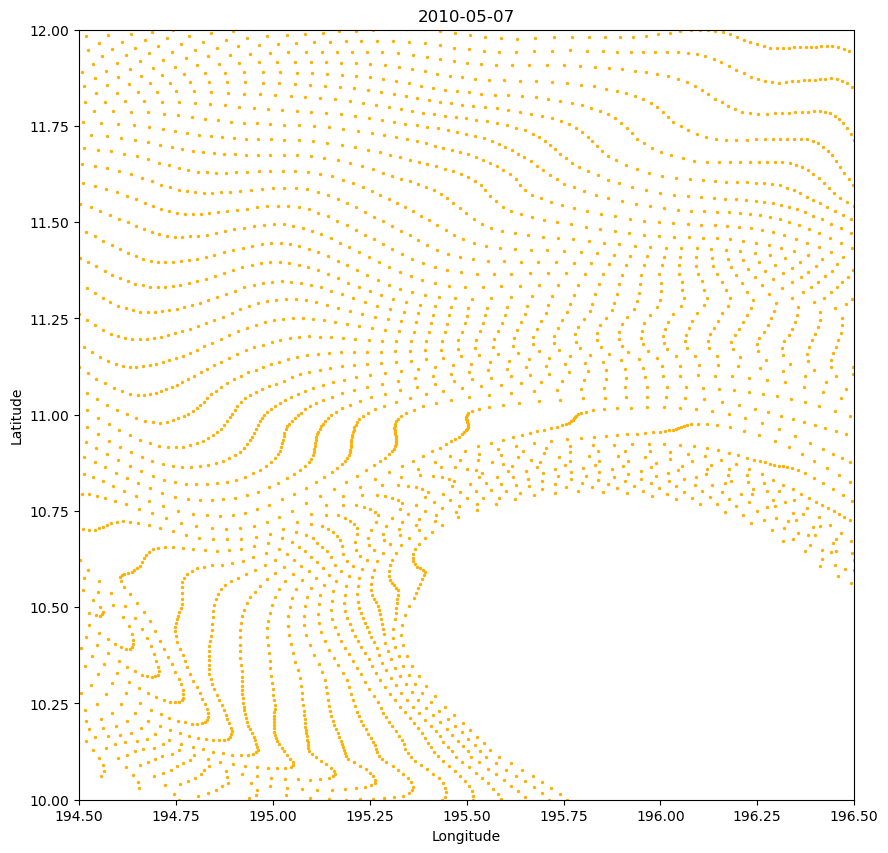

<class 'numpy.datetime64'>


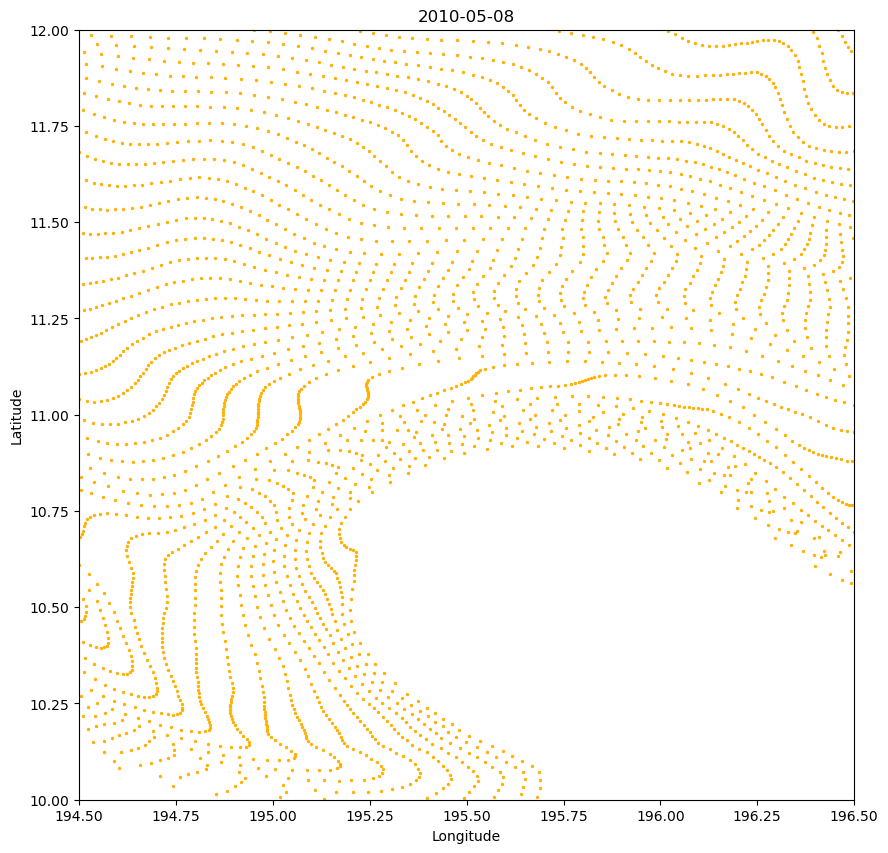

<class 'numpy.datetime64'>


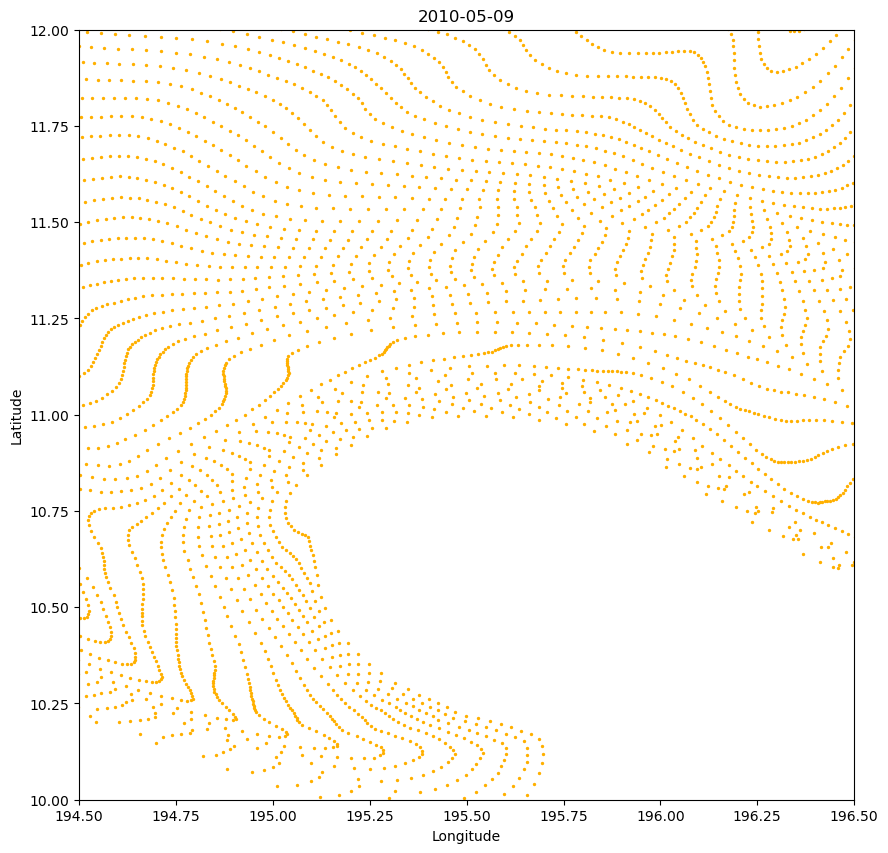

<class 'numpy.datetime64'>


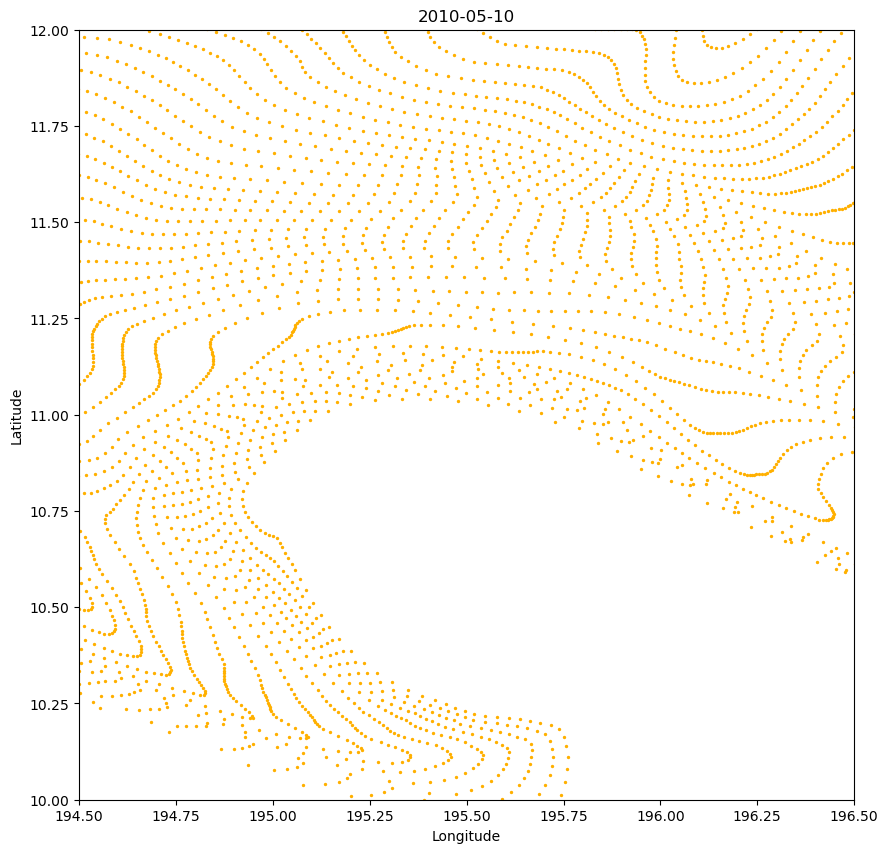

<class 'numpy.datetime64'>


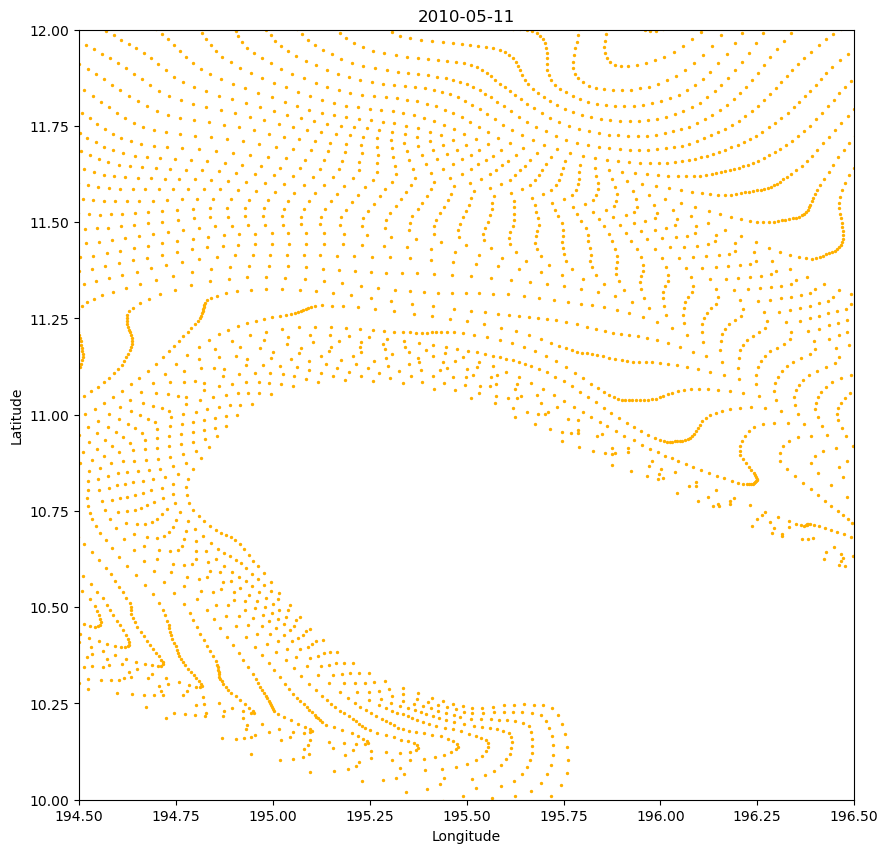

<class 'numpy.datetime64'>


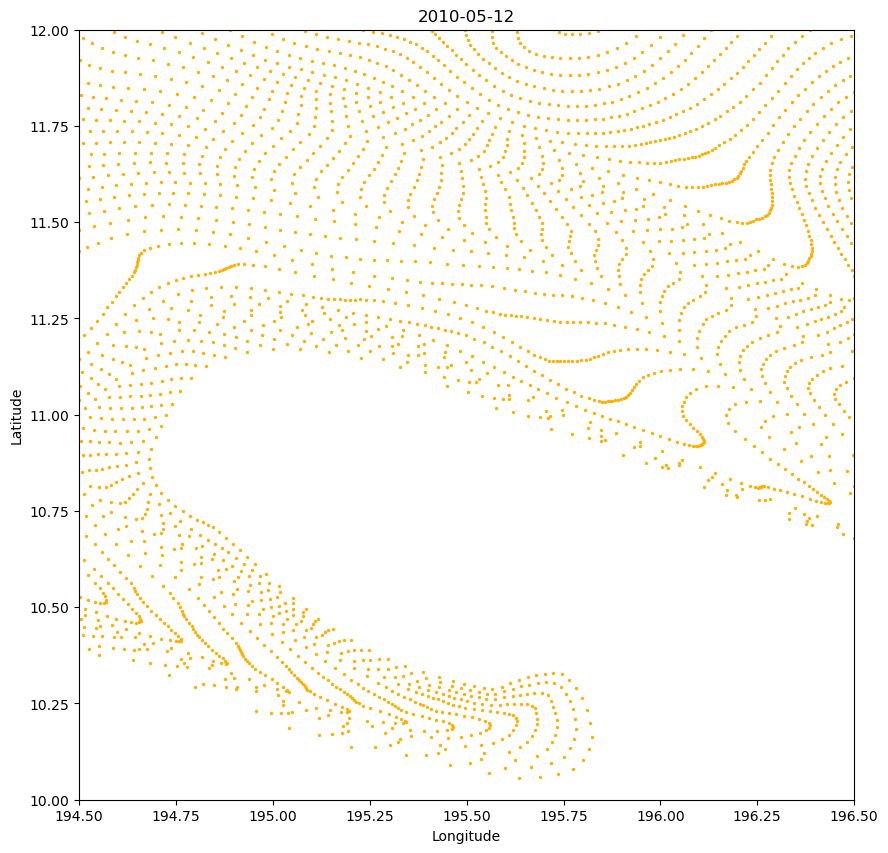

<class 'numpy.datetime64'>


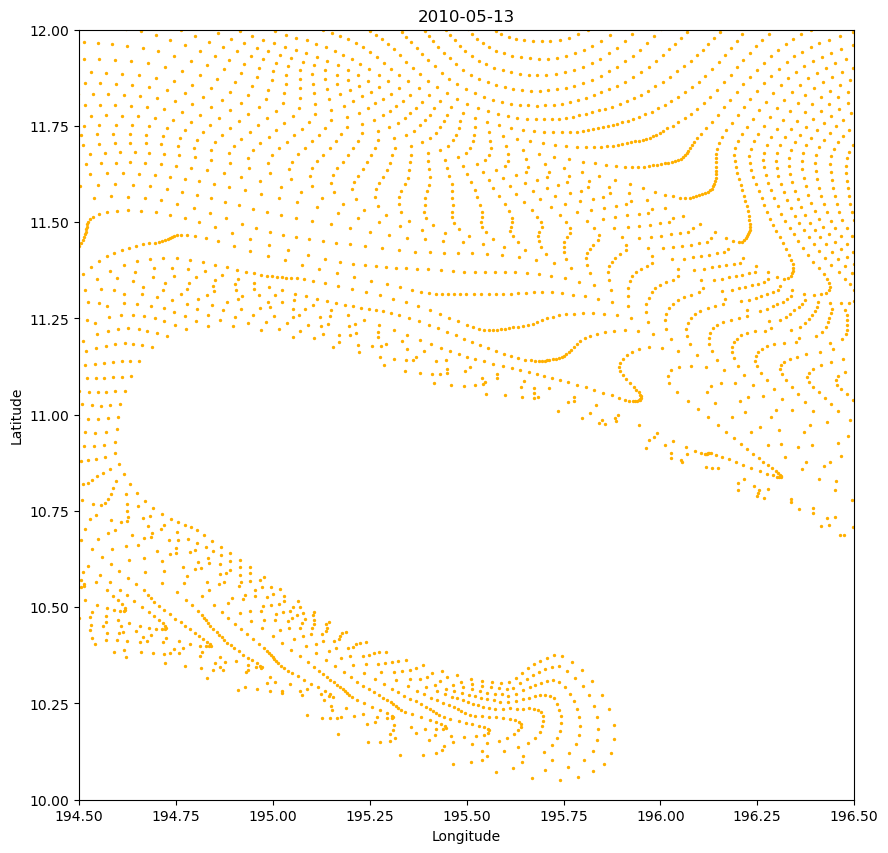

<class 'numpy.datetime64'>


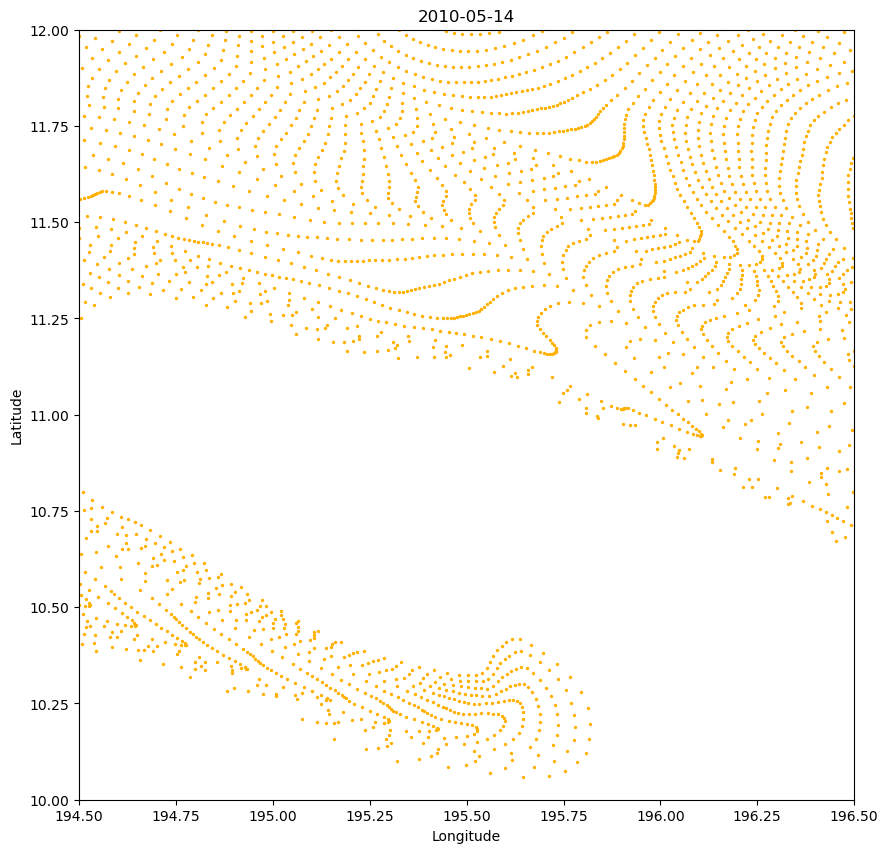

<class 'numpy.datetime64'>


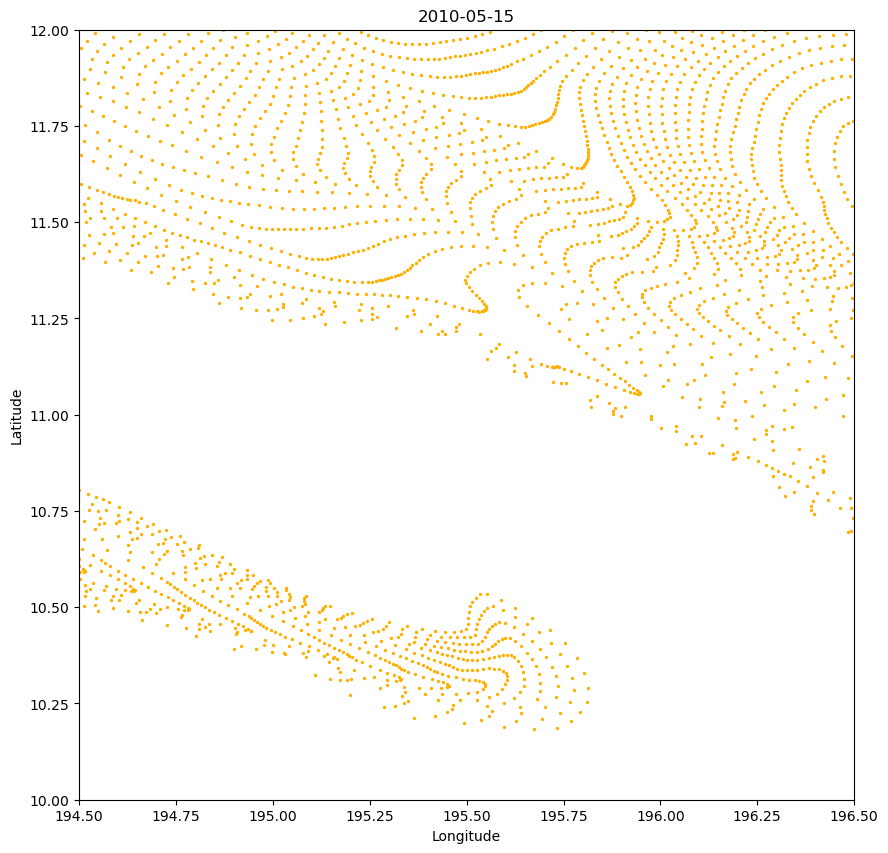

<class 'numpy.datetime64'>


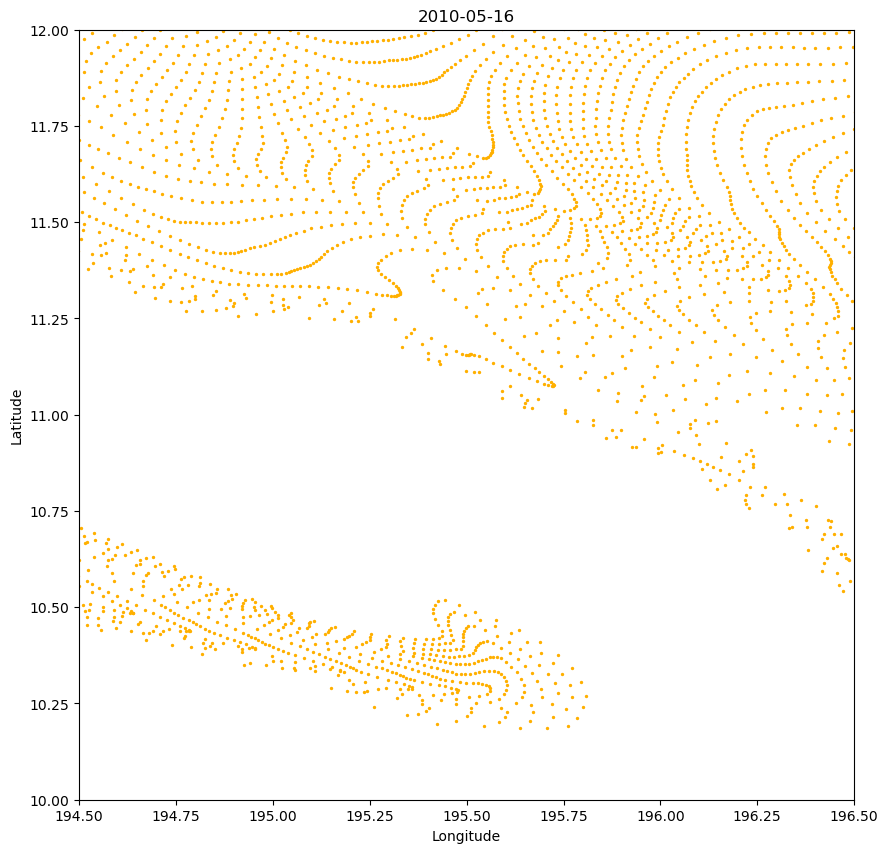

<class 'numpy.datetime64'>


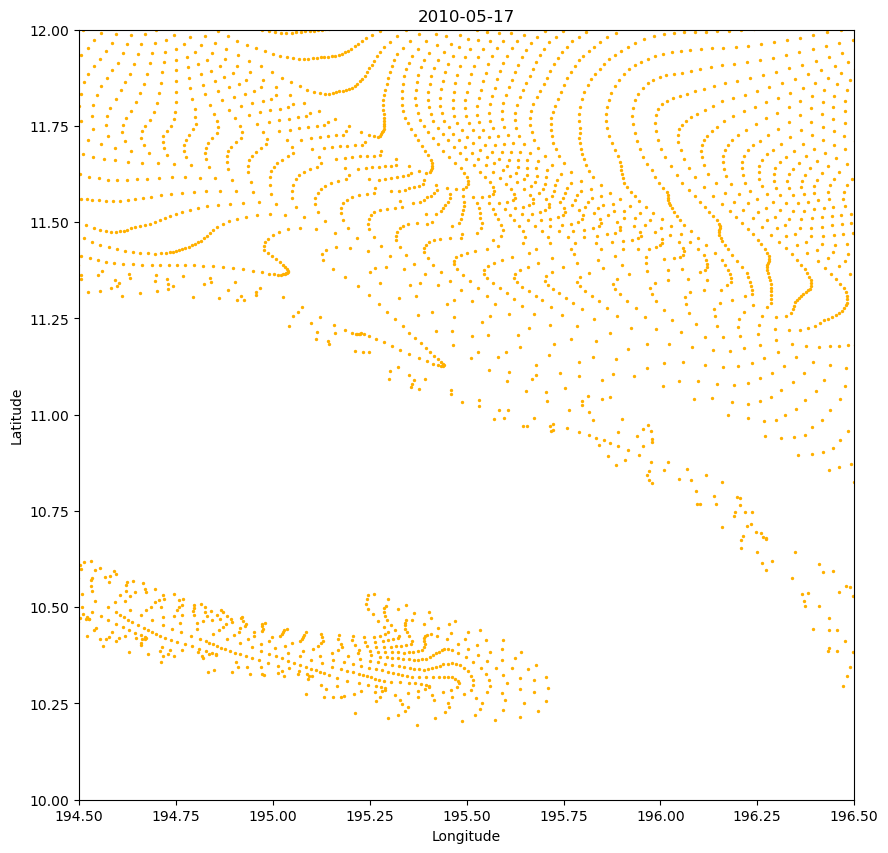

<class 'numpy.datetime64'>


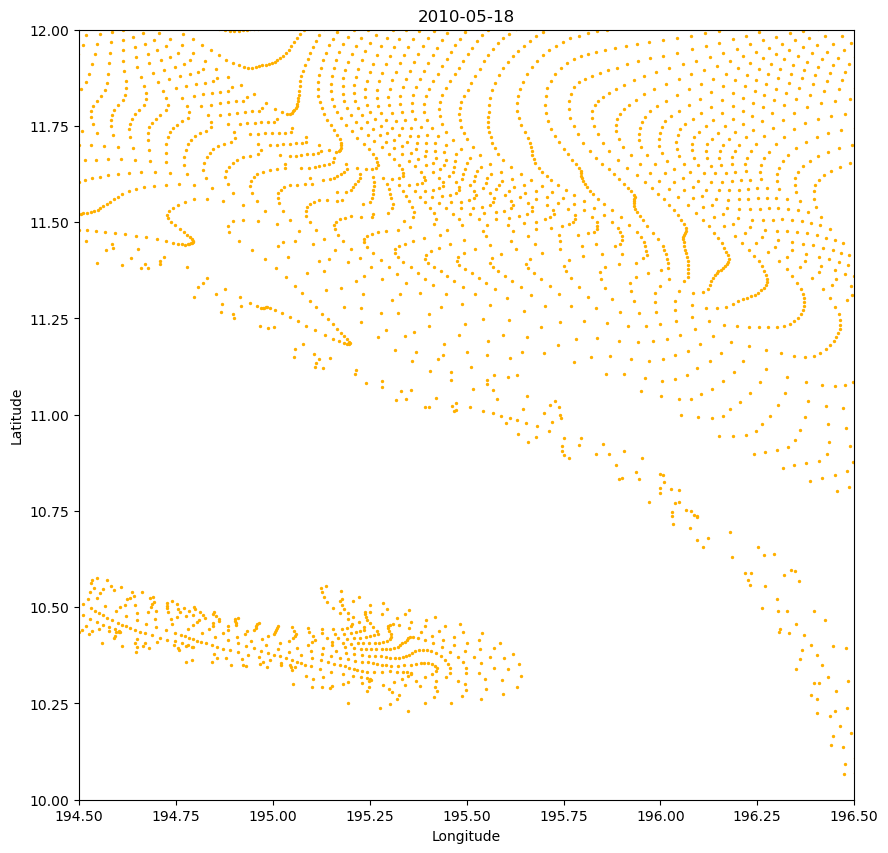

<class 'numpy.datetime64'>


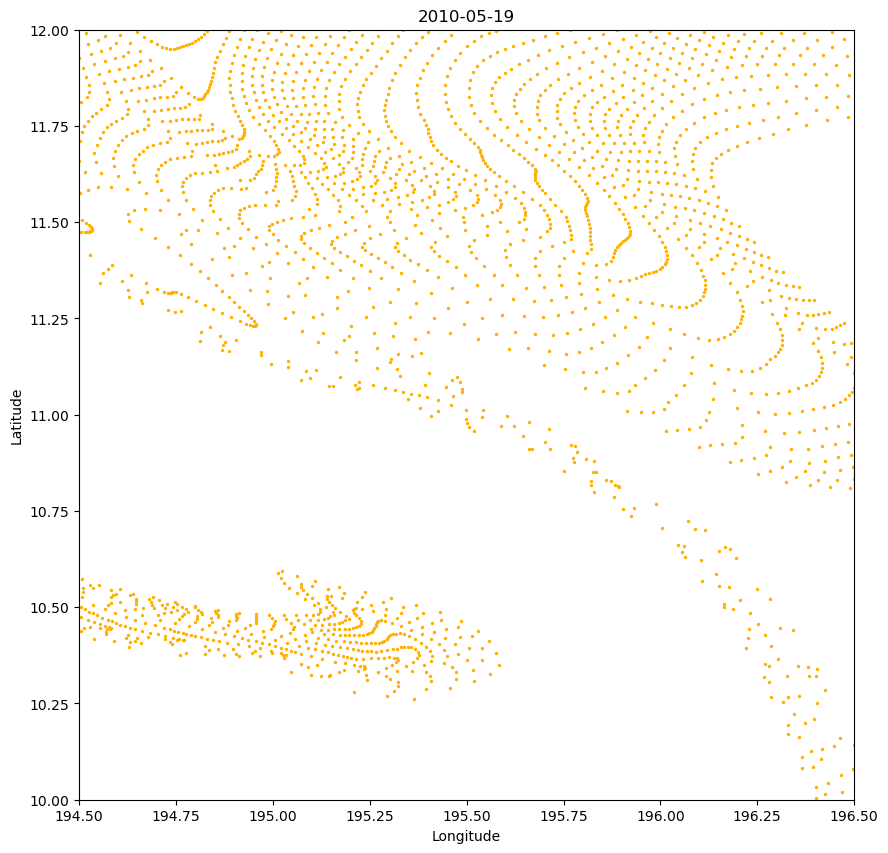

<class 'numpy.datetime64'>


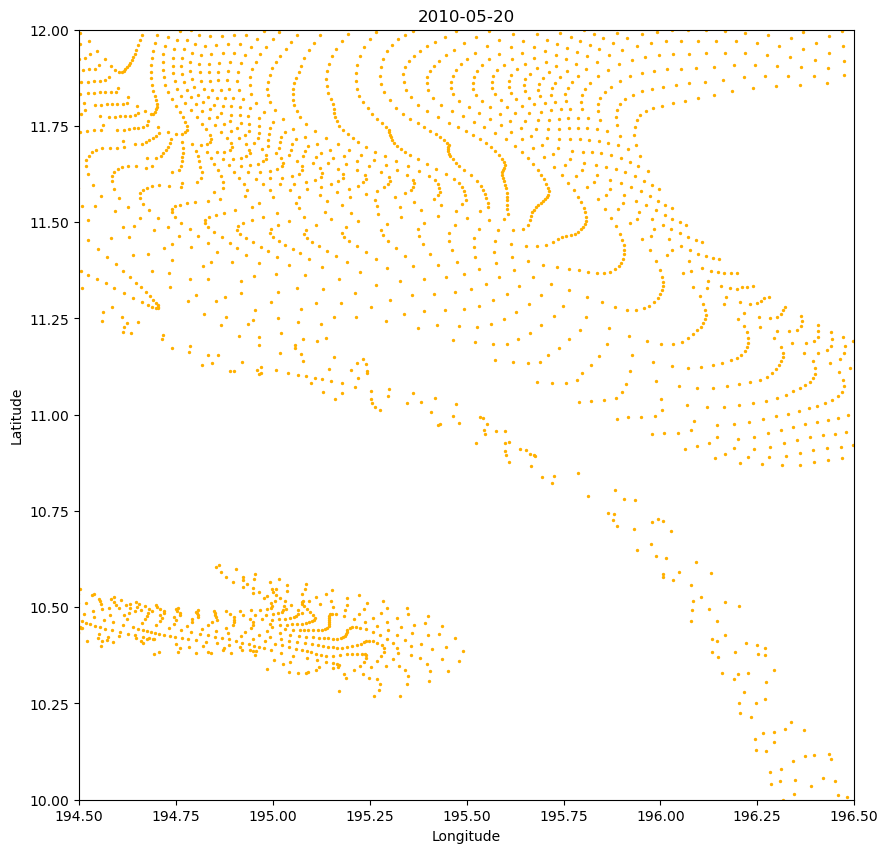

<class 'numpy.datetime64'>


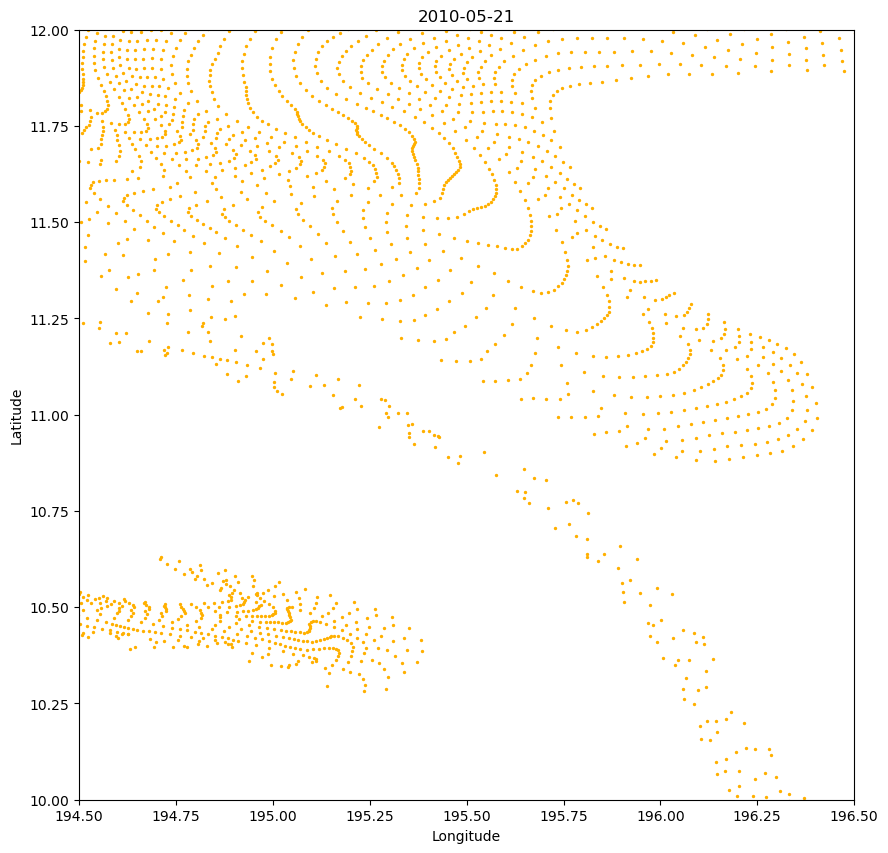

<class 'numpy.datetime64'>


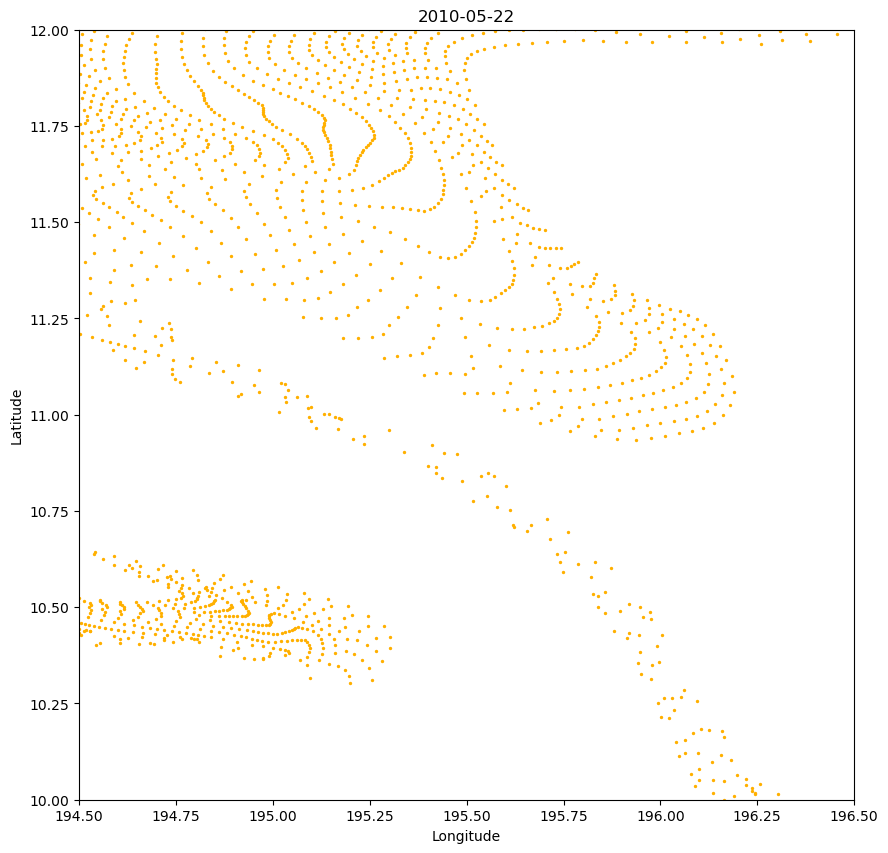

<class 'numpy.datetime64'>


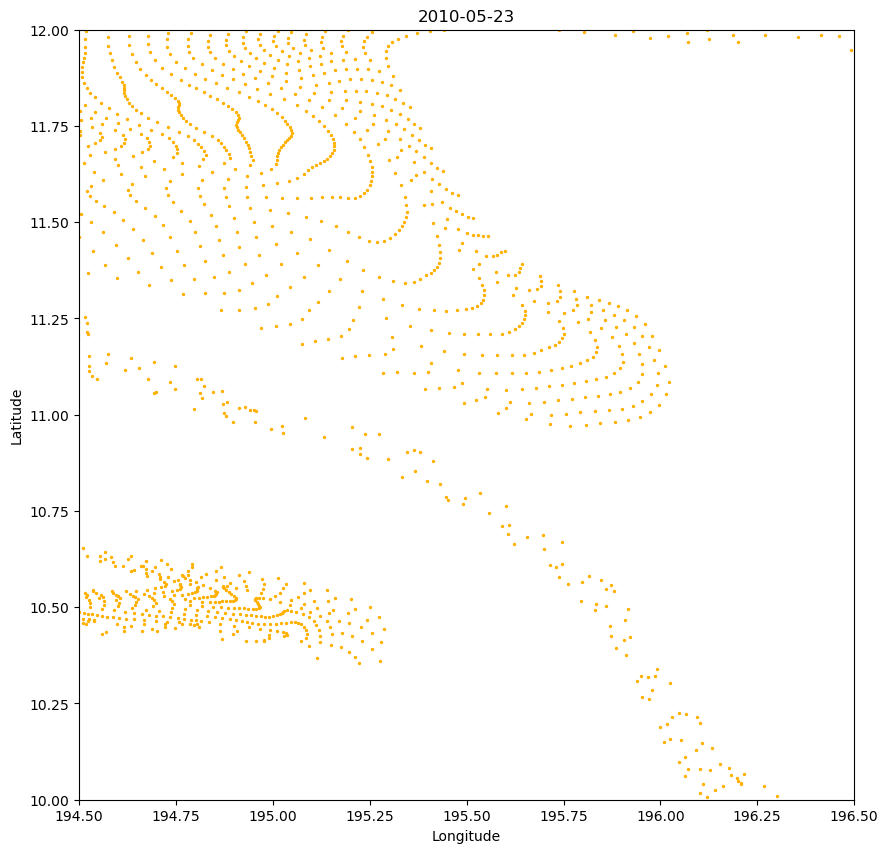

<class 'numpy.datetime64'>


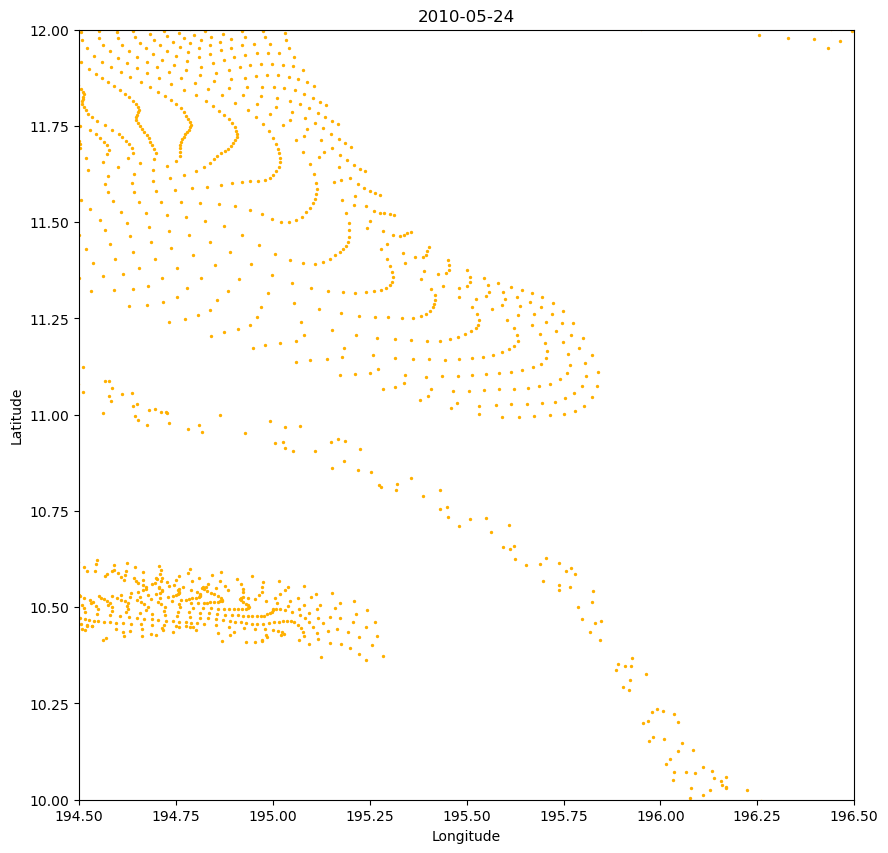

IndexError: Index 131 is out of bounds for axis 1 with size 128

In [35]:

for i in range(1,50):

    # ### background particles
    numb= (i*4)-1
    traj_1= traj.isel(obs=numb) # you have to -1 because it is indexing. will not work for day=0
    traj_lon = traj_1.lon
    traj_lat = traj_1.lat
    traj_time = traj_1.time.values[0]
    print(type(traj_time))
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    plt.xlim([194.5, 196.5])  
    plt.ylim([10, 12]) 
    # back_tails = plt.plot(traj.lon.isel(obs=slice(0,numb)), traj.lat.isel(obs=slice(0,numb)) , '-', linewidth=0.5, color="r")
    # for i in range(0, traj.lon.shape[0], 5):# Adjust step size as needed for fewer trajectories in the plot
    #         plt.plot(lons[i, 0:numb], lats[i, 0:numb], '-', linewidth=0.5, color="r")
    back=plt.scatter(traj_lon, traj_lat, color="#FFB000", marker='o', s = 2)


    ### now add RCLV outline in the right ts
    date_only = traj_time.astype('datetime64[D]')
    eddies_on_the_day = eddy[eddy["date"] == date_only]
    if len(eddies_on_the_day)>0:
        gdf = gpd.GeoDataFrame(eddies_on_the_day, geometry='Polygon')

        gdf.plot(ax=ax, edgecolor='black', facecolor='none')
    
    # Add labels and title
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title(str(date_only))

    # plt.savefig('/home/b/b382618/eddy_figs/trajectories/LAVD_days_RCLVs/diverging_eddy_with_particles/one_'+str(i)+ '.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()
